# Exploratory Data Analysis and Network Analysis

In [1]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from collections import Counter
from joblib import load, dump
from ipywidgets import widgets
import plotly.graph_objects as go
import plotly.express as px
from dash import html, dcc
from dash.dependencies import Input, Output
import matplotlib.gridspec as gridspec
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.stats import entropy
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from wordcloud import WordCloud
import community as community_louvain
from adjustText import adjust_text
import seaborn as sns
import pandas as pd
import numpy as np
import random
import networkx as nx
import pyLDAvis
import dash
import string
import time
import os
import re

The dataframes imported from the previous notebook consist of a document topic distribution with each document being one 5000-word segment of a book and features about the texts covering the following attributes: 'title', 'author', 'date','gender', 'birthdate', 'nationality', 'source' always being given, as well as the following only filled for about 1/4 of the texts 'period', 'mode', 'genre', 'role' and 'polarity', 

Additionally a number of features relevant for th topic explorations offered by pyLDAvis are imported as well.

In [2]:
df_txt_features_LDA=pd.read_csv('./analysis/df_txt_features_LDA.csv')
df_txt_features_CTM=pd.read_csv('./analysis/df_txt_features_CTM.csv')
df_txt_features_ETM=pd.read_csv('./analysis/df_txt_features_ETM.csv')

In [3]:
top_words_per_topic_LDA = ('./analysis/top_words_per_topic_LDA.joblib')
top_words_per_topic_CTM = ('./analysis/top_words_per_topic_CTM.joblib')
top_words_per_topic_ETM = ('./analysis/top_words_per_topic_ETM.joblib')

In [4]:
topic_term_dists_LDA = load('./analysis/topic_term_dists_LDA.joblib')
doc_topic_dists_LDA = load('./analysis/doc_topic_dists_LDA.joblib')
topic_term_dists_CTM = load('./analysis/topic_term_dists_CTM.joblib')
doc_topic_dists_CTM = load('./analysis/doc_topic_dists_CTM.joblib')
topic_term_dists_ETM = load('./analysis/topic_term_dists_ETM.joblib')
doc_topic_dists_ETM = load('./analysis/doc_topic_dists_ETM.joblib')
vocab = load('./analysis/vocab.joblib')
doc_lengths= load('./analysis/doc_lengths.joblib')
term_frequency = load('./analysis/term_frequency.joblib')

## Exploring the feature distribution of the corpus in general

In [ ]:
df_feat = df_txt_features_LDA.copy()
df_feat.fillna({'period': 'Unknown', 'mode': 'Unknown', 'genre': 'Unknown', 'role': 'Unknown'}, inplace=True)

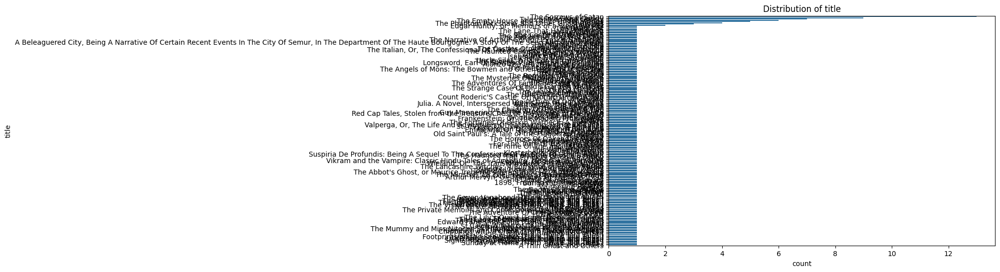

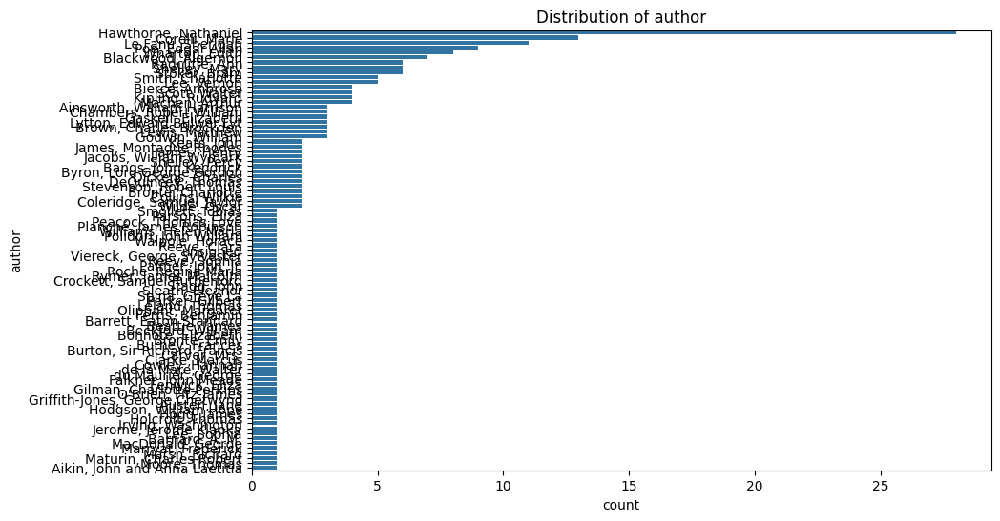

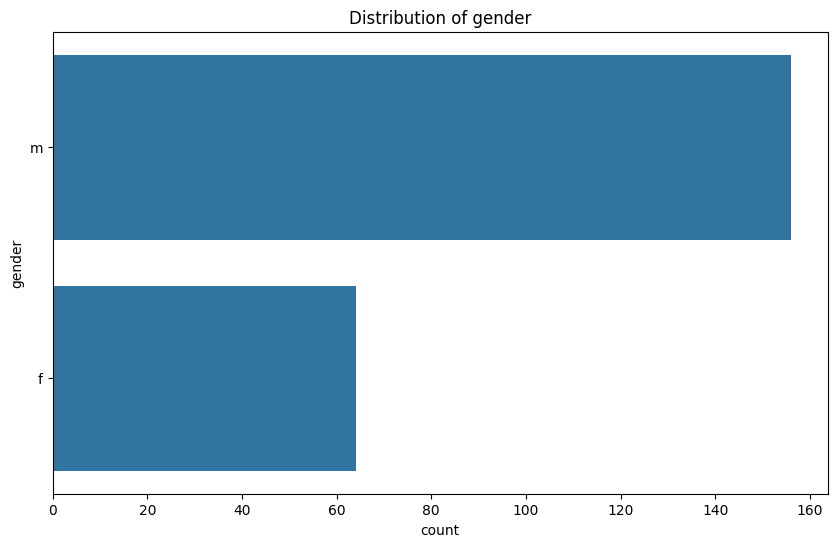

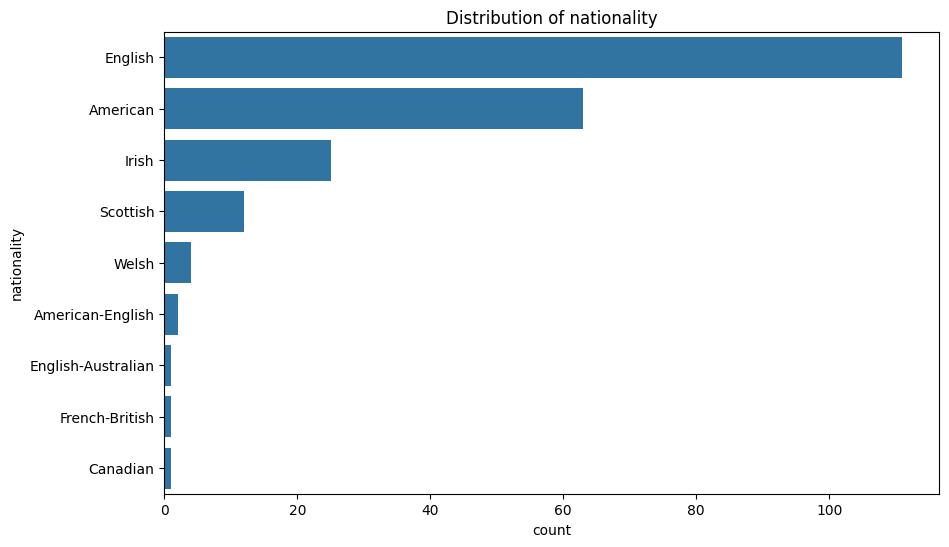

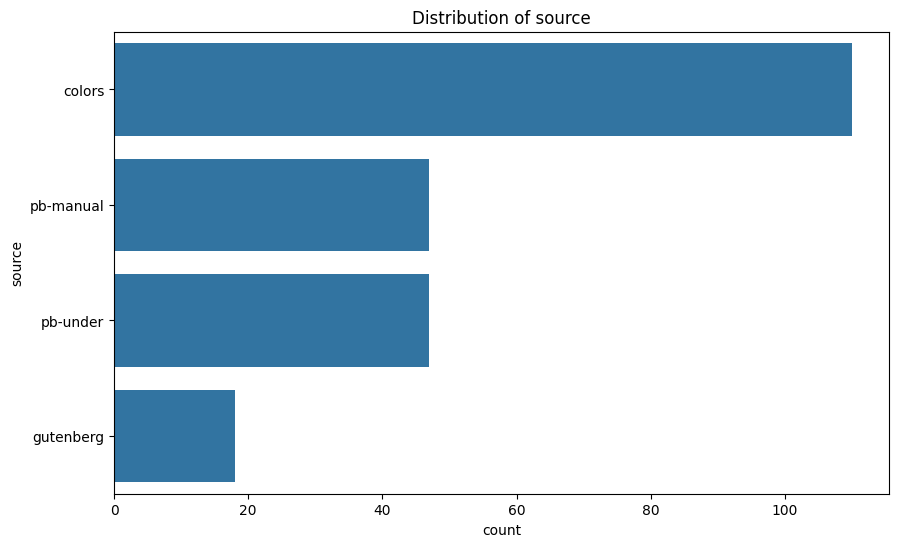

...

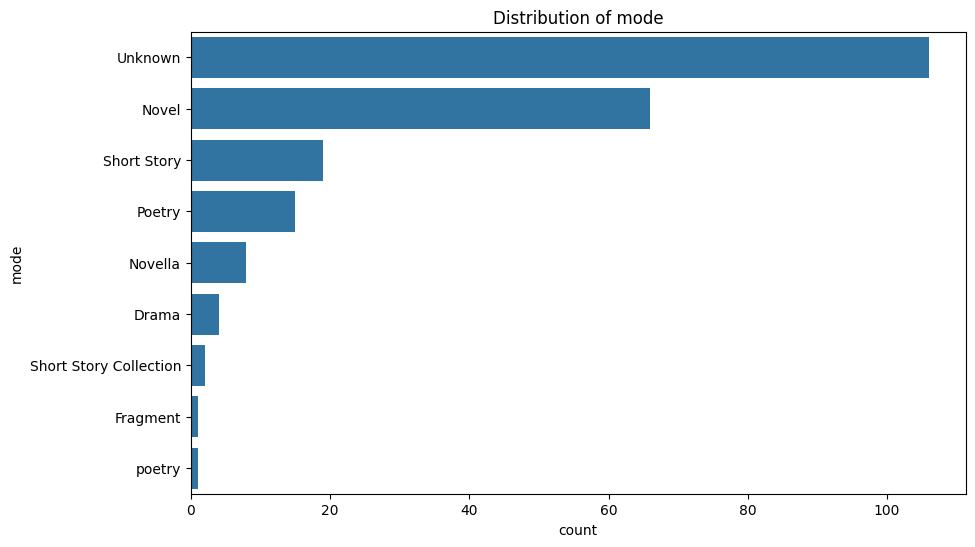

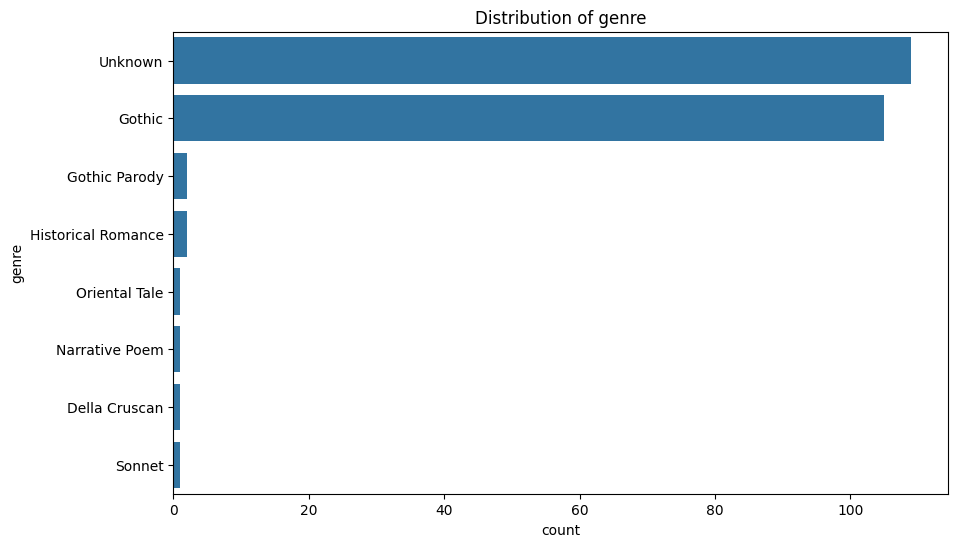

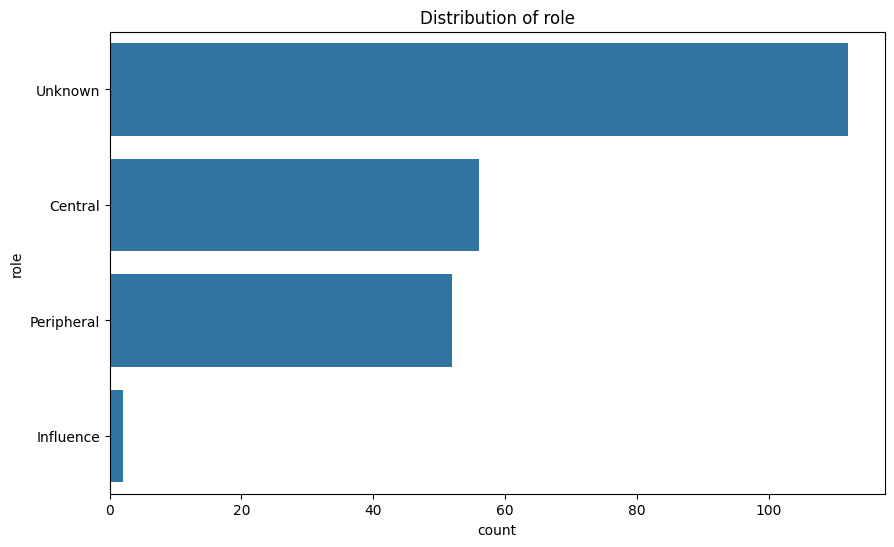

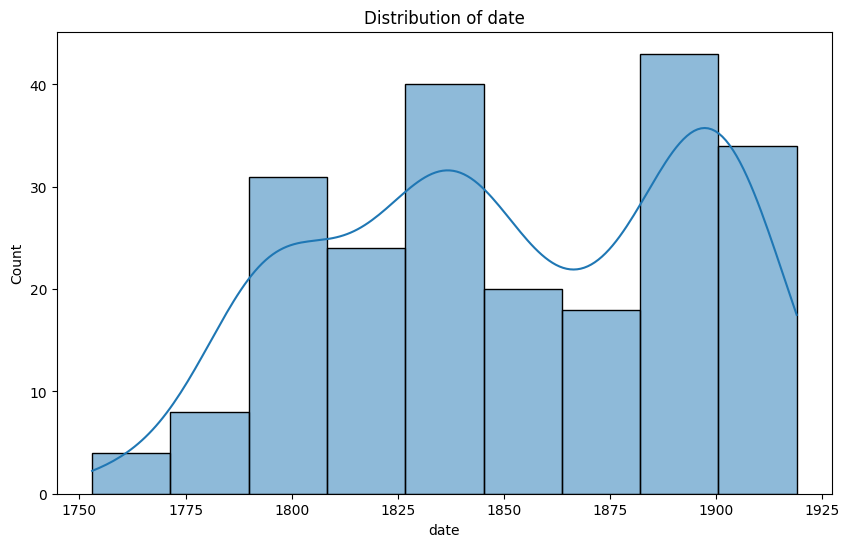

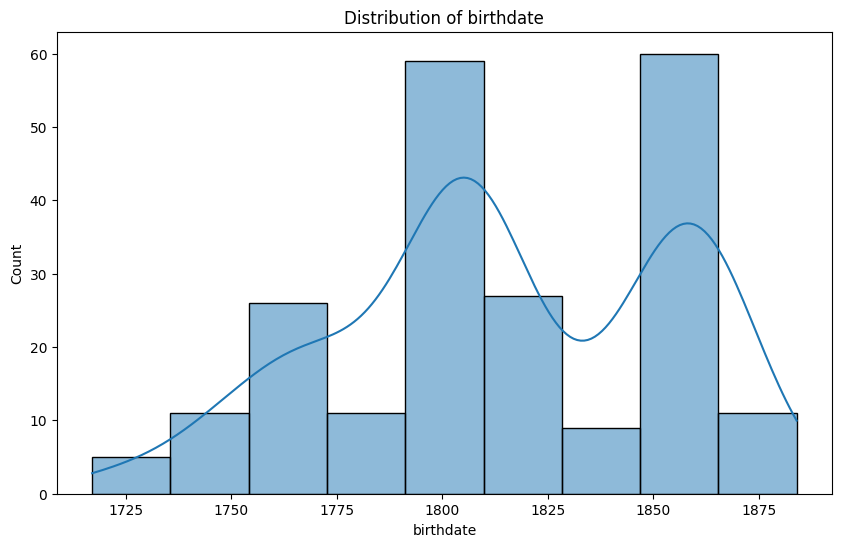

In [ ]:
# Categorical features
categorical_features = ['title', 'author', 'gender', 'nationality', 'source', 'period', 'mode', 'genre', 'role']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    # Ordering the categories by frequency
    order = df_feat[feature].value_counts().index
    sns.countplot(y=feature, data=df_feat, order=order)
    plt.title(f'Distribution of {feature}')
    plt.show()

# Numerical features
numerical_features = ['date', 'birthdate']
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_feat[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

50% of the documents in the corpus are taken from the color corpus, another 20% are drawn from the lists of Underwood, another, 20% from the author lists of punter and botting and 10% make up the shelf of Project Gutenberg and are not covered by any other source. 
Around half of the texts are by British authors, with another 20% of Scotish, Irish or Welsh texts, American texts make up not quite 30% of the distribution. Other English speaking sources rarely occur.

Two thirds of the documents have a male author. The general distribution of publishing dates reflects waves of literary production, reflecting Moretti's assertion of two peeks in the production of the genre (Graphs, Maps, Trees, p,15), at 1800 and 1830, but adds a third peek to it arounnd 1900. A slow fade out in the early 20th centuary was chosen in order to prevent further blurring and muddying of gnere boundaries around the advnt of weird fiction at the beginnung of the 20th centuary.

Information on the period, text type and the role within the larger canon is only provided by the color corpus. Two thirds of the labeled texts fall within the label of Romantic, and roughly one third within the Victorian period, which reflects the distribution of publishing dates, while the former covers the two peaks of the late 18th to the early 19th centuary, the latter category accounts for the peak at around 1900.

Around half of the labeled texts are novels, with another quarter of short stories and novellas, while poetry, drama and other forms are under represented. It is to be expected that the segment of short stories is underreported, given the inclusion of a large segment of short story collections and the propensity of some of the major contributers to the corpus, like Poe, Machen and Blackwood to write exclusively in short fiction formats.

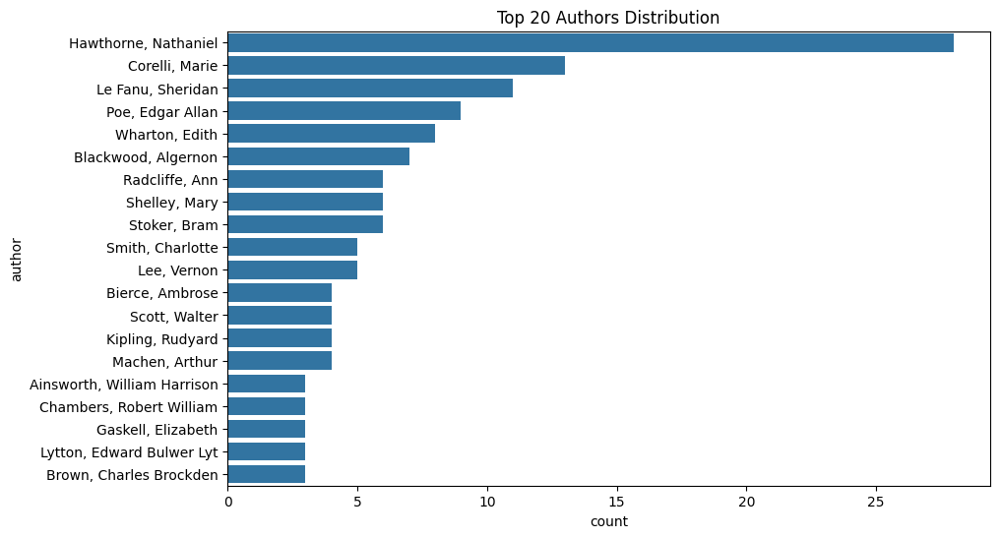

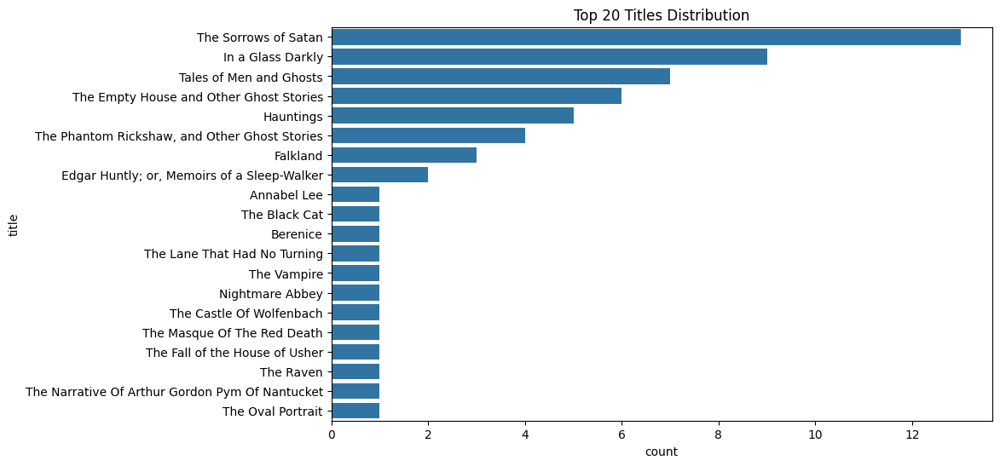

In [ ]:
# Most prevalent titles and authors

top_authors = df_feat['author'].value_counts().nlargest(20).index
top_titles = df_feat['title'].value_counts().nlargest(20).index

# Plotting distributions for 'author'
plt.figure(figsize=(10, 6))
author_order = df_feat['author'].value_counts().iloc[:20].index
sns.countplot(y='author', data=df_feat, order=author_order)
plt.title('Top 20 Authors Distribution')
plt.show()

# Plotting distributions for 'title'
plt.figure(figsize=(10, 6))
title_order = df_feat['title'].value_counts().iloc[:20].index
sns.countplot(y='title', data=df_feat, order=title_order)
plt.title('Top 20 Titles Distribution')
plt.show()

## LDA

pyLDAvis offers an intuitive method for exploring the most important words for ach topic, the weight they carry within it and the relationship and distance between the given topics. For this multidimensional scaling reduces the topic term distribution to a two dimensional space, retaining both the importance of a given topic within the corpus, as well as their distance to one another with the help of Jensen-Shannon Divergence as its metric. A common approach for multi dimesnional scaling.

The following interactive visualization is only properly displayed in the html version or when run locally.

In [5]:
prepared_data = pyLDAvis.prepare(topic_term_dists_LDA, doc_topic_dists_LDA, doc_lengths, vocab, term_frequency)

pyLDAvis.display(prepared_data)

Topic Interpretation:
Analyzing the intersection of the most salient and relevant terms for each topic, aiming to synthesize the underlying themes into coherent labels. Ennui, ants, firmness, confessor, vegetables, illusion, calculation, morbid, blasted, coolies, beggars, bureau, bayonets and terms of logical reasoning are strewn through out many topics, rpovidind a background noise.

In [18]:
topic_labels = {
    "Topic 1": "Ominous Atmosphere - \n Spacial and Auditory Imagery: \n vastness, archaic, Refinement, Gloom, demons.",
    "Topic 2": "Emotional Dialogue -  \n Fear, Secrecy, Flattery,Arousal and Strife \n - Religion and Devils.",
    "Topic 3": "Status and Individuality - \n Striving, Misery and Plentifullness - Excess.",
    "Topic 4": "Myths, Trials and Death - \n Persecution of Crime, Telling Tales, magic and ants.",
    "Topic 5": "Excitablity, Madness and Deceit - \n Aggression, conflict and glee.",
    "Topic 6": "Nature and Reasoning - \n Creativity, Understanding, mixed with Fauna.",
    "Topic 7": "Social Pleasantries - \n Diplomacy, Plotting to Gossip.",
    "Topic 8": "Faith, Convictions, Chivalry and Death - \n Erudition, Religion and Knights. Ants.",
    "Topic 9": "Fortitude, Conviction and Adventure - \n Danger and social Station.",
    "Topic 10": "Ferrocity and Tragedy - \n animalistic traits, intimacy, conflict and science.",
    "Topic 11": "Ravens and Gloom - Longing, Death and Artifice.",
    "Topic 12": "Home Invasion - Domestic Mystery and Conflict.",
    "Topic 13": "Rituals and Festivities - \n Dance, Witchcraft and Coronations.",
    "Topic 14": "Conflict, Animosity and Change - \n Emotional Changes, Death and Construction.",
    "Topic 15": "Trickery and Science - \n Deceit, Reasoning and Institutions.",
    "Topic 16": "Desecrated Chapel - \n Confessions and Defilement - Devils and Maniacs.",
    "Topic 17": "(Un-)death, spectral bodies and judgement - \n human physicality, grief, emotions.",
    "Topic 18": "Mystery and Adversity - \n Dream and fugue states, Investigation.",
    "Topic 19": "Forlorn Carnival - Dances, Disgust and Intimacy.",
    "Topic 20": "Science, Reasoning and Objects - \n Technology, Professions and Nature.",
    "Topic 21": "War, Punishment and Exploration.",
    "Topic 22": "Emotional Dynamics and Interactions.",
    "Topic 23": "War, dreams and demons.",
    "Topic 24": "Human Interactions and Emotional States.",
    "Topic 25": "Flattery, clothing, Interactions.",
    "Topic 26": "Witchcraft, Rituals and Fear of it - \n Banishment, Threats and Armor.",
    "Topic 27": "Dragon Attack and Defense - \n Troops, Mountains and Cynicism.",
    "Topic 28": "Communion in Nature - \n Transformation, Relationships and Identity.",
    "Topic 29": "Bickering, Fighting and Mountains.",
    "Topic 30": "Bureaucracy, Bargaining and Dissatisfaction.",
    "Topic 31": "Exploration, Gloom, Caverns.",
    "Topic 32": "Tranquility and Bustle - \n Terms of Relaxation, Calm and Action.",
    "Topic 33": "Treacherous Company - on the run and scarred.",
    "Topic 34": "Secrets and Suspense - \n Mystery, Devils and Assasinations.",
    "Topic 35": "Mental Illness, Law and Outcasts - \n Fear, Suspicion and Struggles.",
    "Topic 36": "Individualism vs. Conformity - \n Rebellion and Social Norms.",
    "Topic 37": "Order and Chaos - \n Constrained Focus and Unchecked Emotions.",
    "Topic 38": "Psychology, Trauma and Secrets.",
    "Topic 39": "Quest for Meaning - Self-Discovery, Transformation.",
    "Topic 40": "Ambition and Struggle - Emotional Turmoil.",
    "Topic 41": "Despair, Isolation and Oppression.",
    "Topic 42": "Illusion, Enchantment and Betrayal.",
    "Topic 43": "Woodlands, Mystery, Illusion, Beasts.",
    "Topic 44": "Companionship in Times of Trial and Distress.",
    "Topic 45": "Intimacy, Emotions and Identity.",
    "Topic 46": "Frustration, Society, Retreat into Nature - \n Society, Reason, Tension, negative Feelings, Forrests.",
    "Topic 47": "Human Nature and the Connection to the Land, \n Myth and (Human) Nature - Solace, Inspiration, Acceptance for Hardships.",
    "Topic 48": "Enthralling Garden full of Voices - \n Echantment and Vocalization, Nature.",
    "Topic 49": "Departure and Music.",
    "Topic 50": "Myth, Nature, Wonder and Despair.",
    "Topic 51": "Dissilusionment with Society - \n Resistance, Protest, Retreat.",
    "Topic 52": "Adventure, Spendor, Power and Challenges, History.",
    "Topic 53": "Mercantile and Creativity - Haggling and Emotions.",
    "Topic 54": "Medieval Cities, Castles and Courtship.",
    "Topic 55": "Crocodiles, Massacres and Traveling.",
    "Topic 56": "Exploration of an Island and Obsession.",
    "Topic 57": "Carnage near a Castle.",
    "Topic 58": "Weddings and Rituals - Clamoring Throng.",
    "Topic 59": "Judgment and Scrutiny - Tense Diplomacy.",
    "Topic 60": "Confession and marriage before  \n Conscription and Battle.",
    "Topic 61": "Vapires, Ragality, Experiments, \n Festivities and Sacrifice.",
    "Topic 62": "Dragons, Subterraneous Lairs, Riddles and Lore.",
    "Topic 63": "Hidden Dangers, Fear, Anticipation, Supernatural.",
    "Topic 64": "Artistic Ambition and Trials - Mastery and the Devil.",
    "Topic 65": "Atmospheric Battle Descriptions and Royalty.",
    "Topic 66": "Hidden Knowledge, Learning and Secrets.",
    "Topic 67": "Monsters, Art, Romance - Myth and Gloom.",
    "Topic 68": "Secluded Initiation Rites.",
    "Topic 69": "Seduction, Deception, Violence, Bureaucracy.",
    "Topic 70": "Myth and splendor - Wealth and Castles.",
    "Topic 71": "Haunted Castles and their Prohecies.",
    "Topic 72": "Festivities, Noise, Crowds.",
    "Topic 73": "Camps, Trenches and Weather."
}


In [ ]:
'''
Generally speaking the topics can be categrized in a set of main groups: 

-Emotional turmoil and psychologicla distress
-Physical violence and combat
-Social settings, diplomacy and court
-Self expression and frustration with society
-Myth, lore and tales
-Forbidden truths and knowledge
-Adventure and exploration
-Ambition, greed and regality
-Deceit and aprehension
-Science and reasoning
-Nature - woods, mountains and harbors
-Religion and sacred rituals
-Monsters, demons and undead
-Medieval settings, cities and castles
-Dreams and illusions
'''

### Visualizing the qualities of topics

We recreate the term relevance measure used in pyLDAvis and create some wordclouds for ease of comparison

In [ ]:
def calculate_term_relevance(topic_term_dists, term_frequency, lambda_step=0.6):
    """
    Calculate term relevance for each topic.
    Relevance is defined as in pyLDAvis: lambda * log(prob of term given topic) + 
    (1 - lambda) * log(prob of term given topic / prob of term in corpus)
    """
    # Convert term frequency to probability
    term_prob = term_frequency / term_frequency.sum()

    # Log probability of term given topic
    log_prob_w_given_t = np.log(topic_term_dists + 1e-12) # Adding a small constant to avoid log(0)

    # Log lift
    log_lift = np.log(topic_term_dists / term_prob + 1e-12) # Adding a small constant to avoid division by zero

    # Term relevance
    term_relevance = lambda_step * log_prob_w_given_t + (1 - lambda_step) * log_lift

    return term_relevance

In [ ]:
def calculate_saliency(topic_term_dists, term_frequency):
    """
    Calculate the saliency of terms according to the logic of pyLDAvis.
    Saliency(term w) = frequency(w) * [sum_t p(t | w) * log(p(t | w)/p(t))]
    """
    # Convert term frequency to probability
    term_prob = term_frequency / term_frequency.sum()

    # p(t | w)
    p_t_given_w = topic_term_dists / topic_term_dists.sum(axis=1)[:, None]

    # p(t)
    p_t = topic_term_dists.sum(axis=0) / topic_term_dists.sum().sum()

    # Calculating saliency
    saliency = term_prob * np.sum(p_t_given_w * np.log(p_t_given_w / p_t), axis=0)

    return saliency

In [ ]:
def generate_word_clouds(term_relevance, saliency, topic_term_dists_LDA, vocab, n_topics):
    wc_width, wc_height = 200, 200  #  wc size in pixels

    # Create subplot grid
    fig, axs = plt.subplots(nrows=19, ncols=8, figsize=(36, 85)) 
    axs = axs.flatten()

    for i in range(n_topics):
        # Generate salient word cloud
        topic_saliency = saliency * topic_term_dists_LDA[i, :]
        top_salient_terms = topic_saliency.argsort()[-30:][::-1]
        salient_word_freq = {vocab[term]: topic_saliency[term] for term in top_salient_terms}
        salient_wc = WordCloud(width=wc_width, height=wc_height, background_color='white', colormap='Greens').generate_from_frequencies(salient_word_freq)
        axs[i*2].imshow(salient_wc, interpolation='bilinear')
        axs[i*2].axis('off')
        axs[i*2].set_title(f'Topic {i+1} - Salient', fontsize=23)

        # Generate relevant word cloud
        topic_relevance = term_relevance[i, :]
        top_relevant_terms = topic_relevance.argsort()[-30:][::-1]
        relevant_word_freq = {vocab[term]: topic_relevance[term] for term in top_relevant_terms}
        relevant_wc = WordCloud(width=wc_width, height=wc_height, background_color='white', colormap='Reds').generate_from_frequencies(relevant_word_freq)
        axs[i*2+1].imshow(relevant_wc, interpolation='bilinear')
        axs[i*2+1].axis('off')
        axs[i*2+1].set_title(f'Topic {i+1} - Relevant', fontsize=23)

    # Hide the remaining axes
    for i in range(n_topics*2, len(axs)):
        axs[i].set_visible(False)

    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    plt.tight_layout()
    plt.show()

term_relevance = calculate_term_relevance(topic_term_dists_LDA, np.array(term_frequency))
saliency = calculate_saliency(topic_term_dists_LDA, np.array(term_frequency))

generate_word_clouds(term_relevance, saliency, topic_term_dists_LDA, vocab, topic_term_dists_LDA.shape[0])

In order to decrease the overall filesize, the following visualization is provided as an image outside of the notebook itself, please refer to topic_wordclouds.png

#### Topic trends over time

In [7]:
df_time = df_txt_features_LDA.copy()

In [8]:
topic_columns = [col for col in df_time.columns if col.startswith('Topic')]

def year_to_decade(year):
    return (year // 10) * 10

df_time['decade'] = df_time['date'].apply(year_to_decade)

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped = df_time.groupby('decade')[topic_columns].mean()

A general distribution of all topics brings with it too much consistent bottom line noise, so we shall look more closely at those entries that at some point rise to enough prominence.

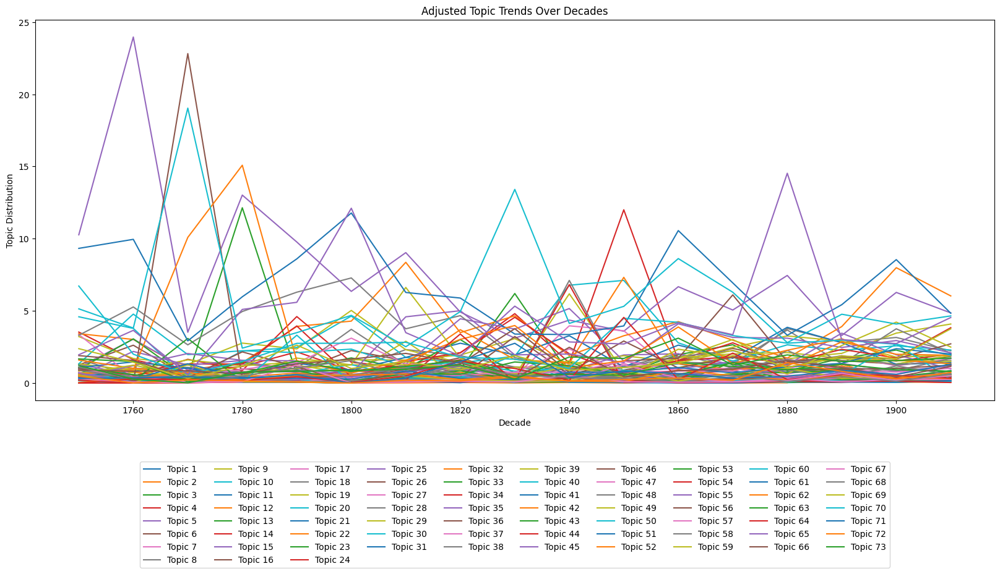

In [ ]:
plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in topic_columns:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

Those topics that surpass a certain threshhold of importance through out their life cycle.
- Filtering for maximal weight through out their lifetime.

In [9]:
# Group 1: Topics that never rise beyond a consistent level
consistent_topics = [topic for topic in topic_columns if decade_grouped[topic].max() <= 8]

# Group 2: Topics that fluctuate
peaking_topics = [topic for topic in topic_columns if decade_grouped[topic].max() > 8]

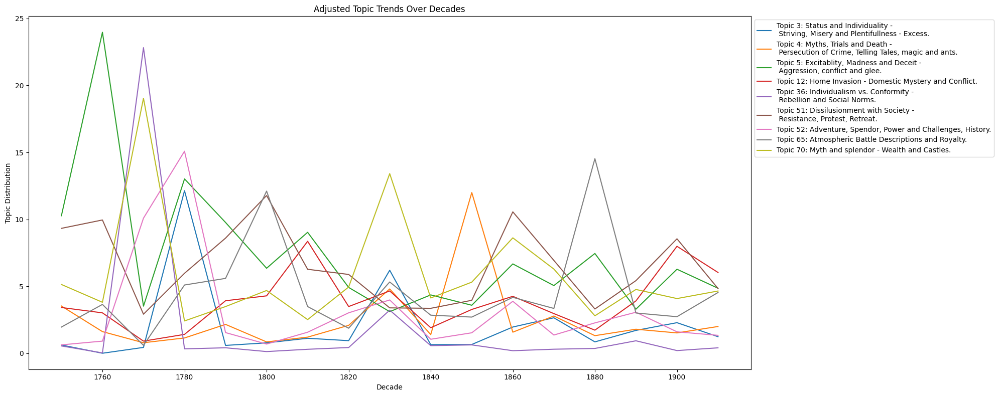

In [ ]:
plt.figure(figsize=(20, 8))
for topic in peaking_topics:
    # Get the label for the topic
    label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    plt.plot(decade_grouped.index, decade_grouped[topic], label=label)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')

# Place the legend to the right of the plot as a single vertical column
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)

plt.tight_layout()

plt.show()


Those topics that surpass a certain threshhold of fluctuation and carry a standard deviation higher than the 75th percentile across all topics, indicating that they do not maintain consistent values and vary significantly over the decades.

In [ ]:
# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped.std()

# Setting a threshold for identifying strong fluctuations
percentile_threshold = np.percentile(topic_fluctuations, 90)

fluctuating_topics = topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

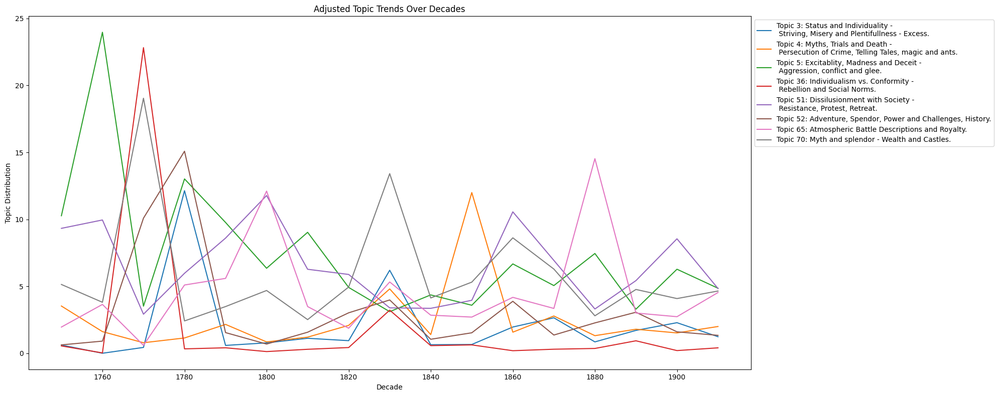

In [ ]:
plt.figure(figsize=(20, 8))
for topic in fluctuating_topics:
    # Get the label for the topic, combining topic number and label
    label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    plt.plot(decade_grouped.index, decade_grouped[topic], label=label)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')

# Place the legend to the right of the plot in a single vertical column
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)

plt.tight_layout()

plt.show()


Now for an interactive version of it, which allows for the dynamic setting of a threshhold, selection of individual topics and closer examination.

Both metrics return a similar picture, putting emphasis on 8 different topics and their distributution through out time. What is clearly visible here is that the three peaks in textual representation, around 1800, 1830 and around 1900, are in part reflected in the rise of specific topics. Topics 3, 36 and 52 peak prior to 1800 and then fade out of importance, 5 peaks early, declines to a moderate degree until 1830 and then remains as a constant undercurrent. 70 on the other hand rises to prominence early, falls out of use, rises very strongly at 1830 becoming a predominant influence and to a lesser degree at 1860, remaining a stable baseline through out as well. 51 and 65 reach a very decisive peak at 1800 and a second at 1860 and 1880 respectively. 4 only shows two peaks, one smaller at 1830 and a large spike  at around 1850.

This selection offers a clear cut through most all of the central motifs of the genre.

Topic 3: Status and Individuality - Striving, Misery and Plentifulness - Excess.

Peaks in the early 1760s, mid-1780s, and early 1800s, suggesting that themes of personal ambition and the consequences of excess were particularly salient during these times. This could reflect societal concerns about the individual's place in a rapidly changing social order in the underlying literature.

Topic 4: Myths, Trials and Death - Persecution of Crime, Telling Tales, magic, and ants.

Shows consistent presence across the timeline with notable peaks in the late 1770s and mid-1850s. Indicating peaks in the  preoccupation with justice, mortality, and the supernatural.

Topic 5: Excitability, Madness and Deceit - Aggression, conflict and glee.

Exhibits spikes around the 1790s and then again in the 1830s. This period coincides with historical events like the French Revolution, the early onset of urbanization and industrialization reflecting the tumultuous nature of the times.

Topic 36: Individualism vs. Conformity - Rebellion and Social Norms.

There's an interesting surge in the early 1790s, a sentiment  that is concurrently explored by the Romantic thinkers, some of them overlapping with the authros of Gothic novels.

Topic 51 & 52: Disillusionment with Society - Resistance, Protest, Retreat. Adventure, Splendor, Power and Challenges, History.

These topics seem to rise and fall in tandem at several points (e.g., 1780s and 1840s), suggesting that tales of adventure and power struggles were often accompanied by themes of societal disillusionment.

Topic 65: Atmospheric Battle Descriptions and Royalty.

Shows a peak around 1810, concurrent with the Napoleonic Wars', while the recontextualization into medieval settings of any vivid battle scenes and discussions of royalty offers a save boundary.

Topic 70: Myth and splendor - Wealth and Castles.

Peaks sharply in the late 1780s and has another smaller peak in the 1830s, aligning with the genre's fascination with the aristocracy and ancient edifices.

The following interactive visualization is only properly displayed in the html version or when run locally.

In [10]:
df_LDA = df_txt_features_LDA.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Formating 'decade' column as int to comply with Dash format requirements
df_LDA['decade'] = df_LDA['date'].astype(int).apply(year_to_decade)

topic_columns_LDA = [col for col in df_LDA.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_LDA = df_LDA.groupby('decade')[topic_columns_LDA].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_LDA.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        hovertext = f"{topic_labels.get(topic, topic)}\n({topic})"
        
        fig.add_trace(go.Scatter(x=decade_grouped_LDA.index, y=decade_grouped_LDA[topic],
                                 mode='lines', name=topic, hovertext=hovertext, hoverinfo="text+x+y"))
    fig.update_layout(height=600, legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])

# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


#### Author-Specific Topic Analysis:

In [7]:
df = df_txt_features_LDA.copy()
topic_columns = [col for col in df.columns if col.startswith('Topic')]

In [8]:
top_authors = df['author'].value_counts().head(20).index.tolist()

central_authors = df[df['role'] == 'Central']['author'].unique().tolist()

refined_central_authors = list(set(central_authors + top_authors))

In [9]:
aggregated_topics_top_authors = pd.DataFrame(index=top_authors, columns=topic_columns)
for author in top_authors:
    aggregated_topics_top_authors.loc[author] = df[df['author'] == author][topic_columns].sum()
aggregated_topics_top_authors = aggregated_topics_top_authors.apply(pd.to_numeric)


# For Top Authors
top_5_topics_top_authors = pd.DataFrame(index=top_authors, columns=['Top1', 'Top2', 'Top3', 'Top4', 'Top5'])
for author in top_authors:
    top_topics = aggregated_topics_top_authors.loc[author].nlargest(5).index.tolist()
    top_5_topics_top_authors.loc[author] = top_topics

filtered_data_top_authors = pd.DataFrame(index=top_authors, columns=topic_columns)
for author in top_authors:
    top_topics = top_5_topics_top_authors.loc[author]
    filtered_data_top_authors.loc[author, top_topics] = aggregated_topics_top_authors.loc[author, top_topics]
filtered_data_top_authors.fillna(0, inplace=True)
filtered_data_top_authors = filtered_data_top_authors.apply(pd.to_numeric)

In [10]:
# Re-aggregate Topic Distribution for the refined list of central authors
aggregated_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    aggregated_topics_refined_central.loc[author] = df[df['author'] == author][topic_columns].sum()
aggregated_topics_refined_central = aggregated_topics_refined_central.apply(pd.to_numeric)

# Identifying Top 5 Topics for the central authors
top_5_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=['Top1', 'Top2', 'Top3', 'Top4', 'Top5'])
for author in refined_central_authors:
    top_topics = aggregated_topics_refined_central.loc[author].nlargest(5).index.tolist()
    top_5_topics_refined_central.loc[author] = top_topics

# Preparing data for visualization
filtered_data_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    top_topics = top_5_topics_refined_central.loc[author]
    filtered_data_refined_central.loc[author, top_topics] = aggregated_topics_refined_central.loc[author, top_topics]
filtered_data_refined_central.fillna(0, inplace=True)
filtered_data_refined_central = filtered_data_refined_central.apply(pd.to_numeric)

<Figure size 2000x1000 with 0 Axes>

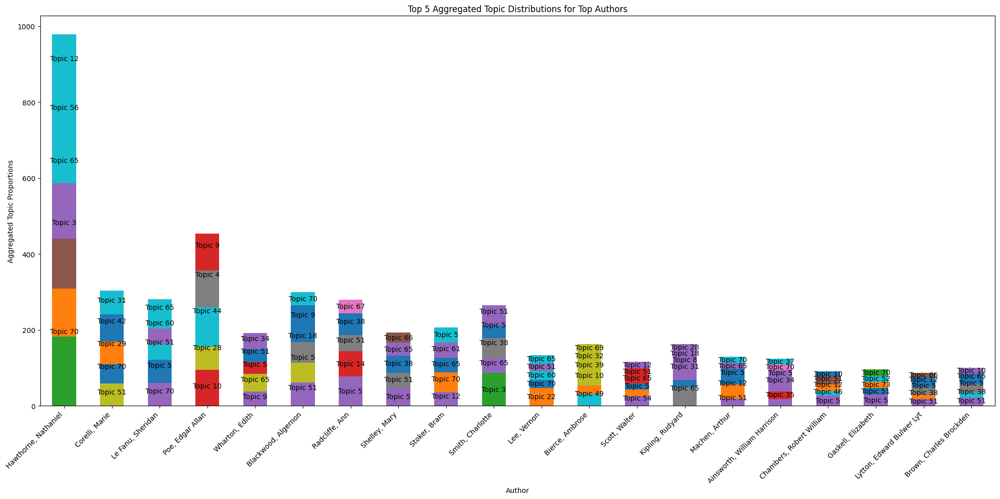

In [12]:
# Creating stacked bar charts with labels for the top 5 topics for Top Authors

plt.figure(figsize=(20, 10))


ax_top = filtered_data_top_authors.plot(kind='bar', stacked=True, figsize=(20, 10), legend=False)

# Adding labels within each bar for Top Authors
for i, author in enumerate(top_authors):
    cum_value = 0
    for topic in top_5_topics_top_authors.loc[author]:
        value = filtered_data_top_authors.at[author, topic]
        if value > 0:
            # Positioning the label in the center of the segment
            ax_top.text(i, cum_value + value/2, topic, ha='center', va='center')
            cum_value += value

plt.title('Top 5 Aggregated Topic Distributions for Top Authors')
plt.xlabel('Author')
plt.ylabel('Aggregated Topic Proportions')
plt.xticks(rotation=45, ha='right')


plt.tight_layout()
plt.show()


The aggressive focus of Topic 12: home invasion for Hawthorne is particulary striking here, just as 69 - Seduction, Deception, Violence, Bureaucracy for Ambrose and 28,Communion in Nature  -Transformation, Relationships and Identity for Kipling.

In [11]:
refined_central_authors = list(set(central_authors + top_authors))

# Re-aggregate Topic Distribution for the refined list of central authors using median
aggregated_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    aggregated_topics_refined_central.loc[author] = df[df['author'] == author][topic_columns].median()
aggregated_topics_refined_central = aggregated_topics_refined_central.apply(pd.to_numeric)

# Identifying Top 5 Topics for the central authors using the updated aggregation
top_5_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=['Top1', 'Top2', 'Top3', 'Top4', 'Top5'])
for author in refined_central_authors:
    top_topics = aggregated_topics_refined_central.loc[author].nlargest(5).index.tolist()
    top_5_topics_refined_central.loc[author] = top_topics

# Preparing data for visualization for refined central authors
filtered_data_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    top_topics = top_5_topics_refined_central.loc[author]
    filtered_data_refined_central.loc[author, top_topics] = aggregated_topics_refined_central.loc[author, top_topics]
filtered_data_refined_central.fillna(0, inplace=True)
filtered_data_refined_central = filtered_data_refined_central.apply(pd.to_numeric)


<Figure size 2000x600 with 0 Axes>

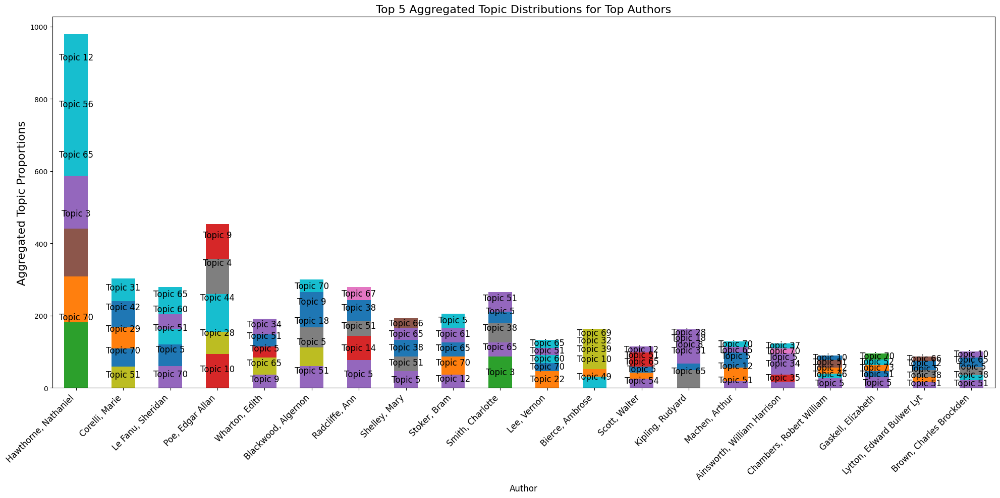

In [18]:
# Increase the figsize significantly to provide enough space
plt.figure(figsize=(20,6)) 

ax_top = filtered_data_top_authors.plot(kind='bar', stacked=True,figsize=(20, 10), legend=False)

# Decrease fontsize to ensure they fit within the segments
topic_label_fontsize = 12

# Add labels within each bar for Top Authors
for i, (idx, row) in enumerate(filtered_data_top_authors.iterrows()):
    cum_value = 0
    for topic in top_5_topics_refined_central.loc[idx]:
        value = row[topic]
        if value > 0:
            # Positioning the label in the center of the segment
            ax_top.text(i, cum_value + value/2, topic, ha='center', va='center', fontsize=topic_label_fontsize)
            cum_value += value

ax_top.set_title('Top 5 Aggregated Topic Distributions for Top Authors', fontsize=16)
ax_top.set_xlabel('Author', fontsize=12)
ax_top.set_ylabel('Aggregated Topic Proportions', fontsize=16)

# Rotate and set fontsize for x-axis tick labels
ax_top.set_xticklabels(ax_top.get_xticklabels(), rotation=45, ha='right', fontsize=12)

plt.tight_layout()

plt.show()

Charlote Smiths heavy reliance on 37 Order and Chaos, Kiplings use of 45 - Enthralling Garden full of Voices, 38 - Psychology, Trauma and Secrets in both Lytton and Brown
Stoker’s and Radcliffe’s bars, for example, show a high proportion of Topic 65: "Atmospheric Battle Descriptions and Royalty", which aligns with their narratives often involving conflict and nobility.
The presence of Topic 12: "Home Invasion - Domestic Mystery and Conflict" is significant in the bars for several authors, including Stoker and Blackwood, which could indicate a shared interest in the intrusion of terror into personal and domestic spheres.
Thematic Shifts and Trends:

Authors with a higher proportion of themes related to societal issues, such as Hawthorne and Corelli, may reflect a more critical view of the status quo, while those with higher proportions of personal and psychological themes, like Poe and Radcliffe, might be more focused on individual experience and interiority.
Historical and Cultural Context:

Some authors show a strong leaning towards topics that may relate to historical events or cultural trends of their time. For instance, Topic 65: "Atmospheric Battle Descriptions and Royalty" in the works of Stoker and Radcliffe could suggest an influence of the political climate of their times, such as the lingering effects of the Napoleonic Wars or the upheaval of the Victorian era.

<Figure size 2000x1000 with 0 Axes>

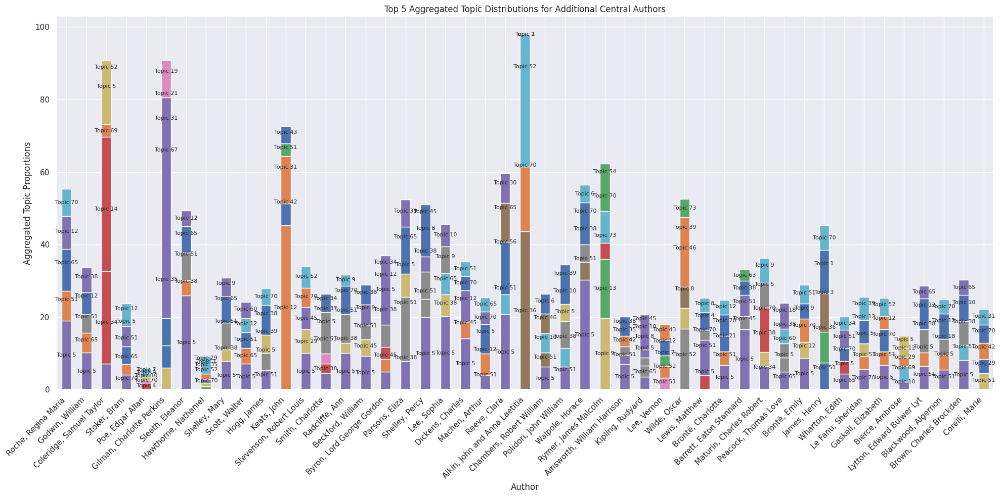

In [ ]:
plt.figure(figsize=(20, 10))

# Plotting the stacked bar chart for Central Authors
ax_refined_central = filtered_data_refined_central.plot(kind='bar', stacked=True, figsize=(20, 10), legend=False)

# Adding labels within each bar for Central Authors
for i, author in enumerate(refined_central_authors):
    cum_value = 0
    for topic in top_5_topics_refined_central.loc[author]:
        value = filtered_data_refined_central.at[author, topic]
        if value > 0:
            # Positioning the label in the center of the segment
            ax_refined_central.text(i, cum_value + value/2, topic, ha='center', va='center', fontsize=8)
            cum_value += value

plt.title('Top 5 Aggregated Topic Distributions for Additional Central Authors')
plt.xlabel('Author')
plt.ylabel('Aggregated Topic Proportions')
plt.xticks(rotation=45, ha='right')


plt.tight_layout()
plt.show()

Here very prominent is the focus of Mathew Lewis on Topic 51: Disillusionment with Society, 52: Adventure, Spendor, Power and Challenges, History. 39: Quest for Meaning - Self-Discovery, Transformation, for Oscar Wilde, 34: Secrets and Suspense - \n Mystery, Devils and Assasinations and 12: Home Invasion - Domestic Mystery and Conflict for John Keats, 14: Conflict, Animosity and Change - \n Emotional Changes, Death and Construction.and 69 for Coleridge, 36: Individualism vs. Conformity - \n Rebellion and Social Norms and 52: Adventure, Spendor, Power and Challenges, History for Aikin, 21 for Gilman and a general heavy reliance on 5: Excitability, Madness and Deceit, With Walpole carrying the highest values for 5, and Shelly second ex equo with Lee Sophia and Reeve Clara.

Generally speaking Topic 5: "Excitability, Madness and Deceit" is a prevalent theme across many authors, reinforcing the idea that Gothic literature frequently explores psychological instability and darker aspects of human behavior. Topic 51: "Disillusionment with Society" appears significantly for several authors as well, suggesting themes of resistance against societal norms and the exploration of characters who are at odds with their social context.

Topic 70: "Myth and splendor - Wealth and Castles" is prominent for authors like Charles Maturin, Arthur Machen and Walpole, and indicating a focus on grandeur, historical settings, and perhaps a reflection on the role of the past in shaping individual identities and social structures. Oscar Wilds most prevalent topics 52: Adventure, Spendor, Power and Challenges, History and 39: Quest for Meaning - Self-Discovery, Transformation mirror these tendencies of a nostalgic fascination with the past and a drive for self-actualization.

Sleath Eleanor, Parsons Eliza, Lee Sophia and Reeve Clara have a significant presence of Topic 65: "Atmospheric Battle Descriptions and Royalty", which could reflect their works that delve into grand conflicts and courtship.

For instance, John Keats, Algernon Blackwood and Bram Stoker have a considerable portion of their bars dedicated to Topic 5: "Excitability, Madness and Deceit" and Topic 12: "Home Invasion - Domestic Mystery and Conflict", suggesting a focus on personal turmoil and the encroachment of danger into personal spaces.

Recurring Topics Across Authors Median Values:

Topic 5: "Excitability, Madness and Deceit - Aggression, conflict and glee" seems to be a prevailing theme among almost all authors, indicating that elements of madness, deceit, and emotional extremes,
Topic 51: "Disillusionment with Society - Resistance, Protest, Retreat" is also frequently present, suggesting a common narrative thread where characters grapple with societal norms and often feel a sense of disillusionment, while engaged in uncanny and intimate struggles that rage close to home and yet have a far a way air to them. 
Topic 10: "Ferrocity and Tragedy - animalistic traits, intimacy, conflict and science.", Topic 12: "Home Invasion - Domestic Mystery and Conflict.",
Topic 70: Myth and splendor - Wealth and Castles.",

Marie Corelli and Nathaniel Hawthorne share a common interest in Topic 29: "Bickering, Fighting and Mountains", which might suggest a thematic focus on interpersonal conflict and possibly the rugged landscapes that are often a backdrop in Gothic tales.

Edgar Allan Poe is unique with Topic 28: "Communion in Nature - Transformation, Relationships and Identity", resonating with Poe's themes of personal transformation, identity, and often a deep connection with the natural world as a setting for his narratives.

Arthur Machen shows a distinct association with Topic 12: "Home Invasion - Domestic Mystery and Conflict", highlighting his interest in the invasion of the domestic sphere by supernatural or mysterious setting, especially befitting his many texts on supernatural boundary transgressions and invaders from other worlds.

Nathaniel Hawthorne:
Distinct Theme: Topic 70: "Myth and splendor - Wealth and Castles"

Hawthorne’s works often grapple with the moral legacy of Puritanism, and his focus on myths and castles may be seen as an allegory for the grand narratives and moral edifices of his own culture. This theme suggests a preoccupation with the past's weight on the present, reflecting a distinctly American perspective on history, morality, and identity.

Effect: Hawthorne's use of myth and grand settings creates a sense of historical depth and moral complexity, often questioning the possibility of redemption from past sins. His characters are frequently caught between the opulence of tradition and the necessity of moral integrity, exemplified in works like "The House of the Seven Gables."

Edgar Allan Poe:
Distinct Theme: Topic 28: "Communion in Nature - Transformation, Relationships and Identity"

Poe's unique theme reflects his exploration of the individual's psyche and the transformative power of nature. He frequently uses natural settings as a mirror for or a catalyst to internal psychological states.

Effect: Poe’s narratives often lead to moments of epiphany or horror as his characters confront their own identities. Nature in Poe's works is not just a backdrop but an active participant in the narrative, influencing and reflecting the characters' mental and emotional journeys.

Arthur Machen:
Distinct Theme: Topic 12: "Home Invasion - Domestic Mystery and Conflict"

Machen's focus on the invasion of the domestic sphere might hint at his an interest in the vulnerability of personal space and the erosion of the boundaries between the safe and the profane.

Effect: This theme often leads to a deep-seated unease, as the sanctity of home is breached by otherworldly forces, making the familiar become uncanny. Machen's work could be seen as prefiguring the modern psychological horror genre that frequently uses similar themes.

Marie Corelli:
Distinct Theme: Topic 29: "Bickering, Fighting and Mountains"

Corelli’s narratives weave together interpersonal conflict with dramatic natural landscapes, perhaps reflecting the emotional turmoils and societal upheavals of her time.

Effect: The recurring theme of conflict against the backdrop of imposing nature may symbolize the characters' internal struggles and the larger societal conflicts. Mountains in her work might serve as a metaphor for obstacles to be overcome or as imposing witnesses to human folly.

Sheridan Le Fanu:
Distinct Theme: Topic 5: "Excitability, Madness and Deceit - Aggression, conflict and glee"

Le Fanu’s Gothic tales often revolve around psychological ambiguity and unreliable narrations, with madness and deceit as central elements.

Effect: The focus on madness and deceit creates a pervasive sense of paranoia and questions the nature of reality itself. His stories such as "Carmilla" and "Uncle Silas" often feature characters whose grip on sanity is as tenuous as the reader's understanding of the true narrative.

Bram Stoker:
Distinct Theme: Topic 61: "Vampires, Regality, Experiments, Festivities and Sacrifice"

Stoker, most famous for "Dracula," prominently features themes of vampirism, which intertwine regality and horror, bringing to the fore the anxieties of the fin-de-siècle era regarding degeneration and the breakdown of social norms.

Effect: Stoker’s work creates a contrast between the allure of the aristocratic vampire and the horror of its predatory nature. This theme often explores the fear of the foreign and the taboo, reflecting societal concerns about purity, invasion, and the breakdown of rigid Victorian social structures.

Each of these authors has contributed to the richness of Gothic fiction by exploring distinct themes that resonate with the core of human experience—fear, identity, morality, and the social order.

Metaphysical and Philosophical Inquiry Group:
Authors in this group explore themes of existence, the supernatural, and the search for meaning. Topics like Topic 39: "Quest for Meaning - Self-Discovery, Transformation" and Topic 66: "Hidden Knowledge, Learning and Secrets" are significant.
Authors: Le Fanu, Shelley, Wilde, Polderige and Hogg

Gothic Romanticism Group:
This category includes authors whose works have a strong element of romance intertwined with the Gothic, often exploring the tension between desire and morality. Topics like Topic 28: "Communion in Nature - Transformation, Relationships and Identity" and Topic 44: "Companionship in Times of Trial and Distress" or "Topic 6": "Nature and Reasoning - \n Creativity, Understanding, mixed with Fauna.", are indicative.
Authors: Poe, Kippling, Le Fanu, Hawthorne

Supernatural and Horror Group:
Authors who frequently delve into the supernatural, horror, and the unknown belong here. They explore themes encapsulated by topics such as Topic 61: "Vampires, Regality, Experiments, Festivities and Sacrifice" 
Authors: Stoker, Byron, Stevenson

Social and Political Commentary Group:
These authors use Gothic elements to critique social and political structures. Topics that stand out include Topic 36: "Individualism vs. Conformity - Rebellion and Social Norms" and Topic 51: "Disillusionment with Society - Resistance, Protest, Retreat".
Authors: Hawthorne, Brown, Lytton, Gaskell, Chambers, Ainsworth, Machen, Scott, Lee Vernon, Smith Charlotte, Stoker, Shelly Mary, Radcliff, Blackwood, Wharton, Le Fanu, Corelli share a method of expressing social discontent with the use of topic 51.

Historical and Mythic Reconstruction Group:
Works by these authors are characterized by a strong sense of history and the interweaving of myth within their narratives. Prominent topics are Topic 54: "Medieval Cities, Castles and Courtship" and Topic 70: "Myth and splendor - Wealth and Castles".
Authors: Radcliffe, Hawthorne, Corelli, Le Fanu, Wharton, Blackwood, Stoker, Lee Vernon, Scott, Machen, Ainsworth, Gaskell

Pioneers of the Psychological Thriller Group:
This grouping is for authors who laid the groundwork for what would become the psychological thriller, focusing on the human mind's complexities and its vulnerabilities. Topics such as Topic 5: "Excitability, Madness and Deceit", Topic 38: "Psychology, Trauma and Secrets"  and "Topic 44": "Companionship in Times of Trial and Distress.", are central.
Authors: Le Fanu, Wharton, Blackwood, Radcliffe, Shelley, Stoker,Smith Charlotte, Bierce, Machen, Chambers

Nature and the Sublime Group:
Authors in this group integrate the natural world deeply into their Gothic narratives, often to evoke feelings of the sublime or to reflect the characters' inner turmoil. Look for topics like Topic 6: "Nature and Reasoning - Creativity and Understanding, mixed with Nature" and Topic 28: "Communion in Nature - Transformation, Relationships and Identity".
Authors: Poe, Shelley, Kipling, Chambers.

Conflict and Societal Restructure Group:
These authors focus on the chaos and order of society, the collapse of old structures, and the struggle for new identities. Topics such as Topic 14: "Conflict, Animosity and Change" and Topic 37: "Order and Chaos - Constrained Focus and Unchecked Emotions" and Topic 29: "Bickering, Fighting and Mountains", are highlighted.:
Authors: Bierce, Hawthorne, Marie Corelli,Radcliffe,Smith Charlotte

#### The most prevalent topics among these authors throughout time

In order to get a better idea of who plbished at what time and thus influenced the topic distribution, the distribution of publications per author will be plotted

In [12]:
top_authors = df['author'].value_counts().head(20).index.tolist()

central_authors = df[df['role'] == 'Central']['author'].unique().tolist()

refined_central_authors = list(set(central_authors + top_authors))

publication_dates = df[df['author'].isin(refined_central_authors)].groupby(['date', 'author']).size().unstack(fill_value=0)

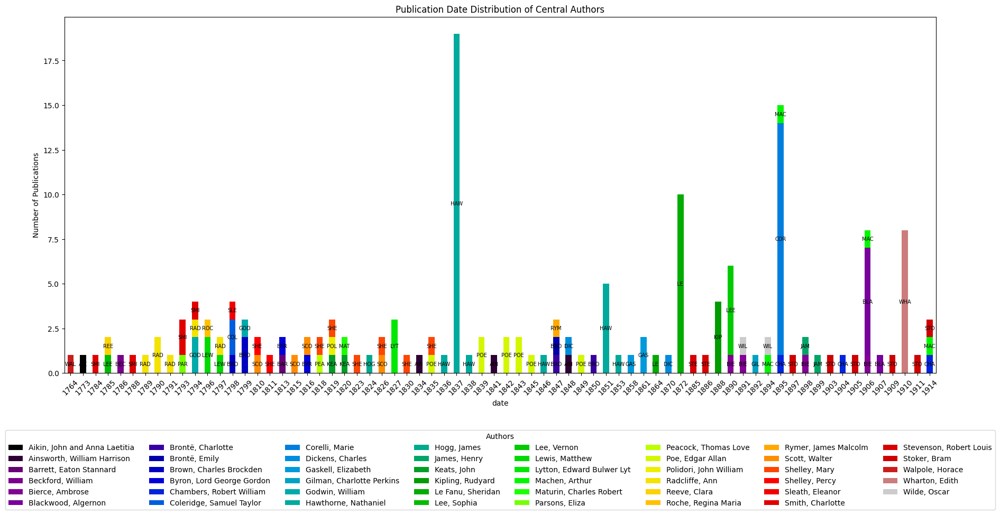

In [20]:
# Generate the plot
fig, ax = plt.subplots(figsize=(20, 10))

# Plot the data
publication_dates.plot(kind='bar', stacked=True, colormap='nipy_spectral', edgecolor='none', ax=ax)

# Iterate over each stack (author) in the bar chart
for i, author in enumerate(publication_dates.columns):
    bars = ax.containers[i]
    labels = [author[:3].upper() if bar.get_height() > 0 else '' for bar in bars]  # Label only bars with height > 0
    ax.bar_label(bars, labels=labels, label_type='center', fontsize=7)  # Set labels to the center of each bar

ax.legend(title='Authors', bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=8)

ax.spines['bottom'].set_visible(True)
ax.tick_params(bottom=True, labelbottom=True) 


ax.set_title('Publication Date Distribution of Central Authors')
ax.set_ylabel('Number of Publications')

# Avoiding clipping elements on the x axis
years = publication_dates.index
ax.set_xticks(range(0, len(years), 1))
ax.set_xticklabels([years[i] for i in range(0, len(years), 1)], rotation=45)

plt.tight_layout()
plt.show()

In [13]:
combined_topics = pd.concat([aggregated_topics_top_authors, aggregated_topics_refined_central])

# Determining the 10 most prevalent topics across the combined set
top_10_topics = combined_topics.sum().nlargest(10).index.tolist()

# Time Series
# Aggregating occurrences of each of the 15 topics by year
time_series_data = df[df['author'].isin(top_authors + refined_central_authors)]

# Creating a DataFrame to store the yearly aggregated values for each topic
yearly_topic_aggregation = pd.DataFrame(index=time_series_data['date'].unique(), columns=top_10_topics)

# Aggregating the topics by year
for topic in top_10_topics:
    yearly_data = time_series_data.groupby('date')[topic].sum()
    yearly_topic_aggregation[topic] = yearly_data

# Sorting the index to ensure it's in chronological order
yearly_topic_aggregation.sort_index(inplace=True)

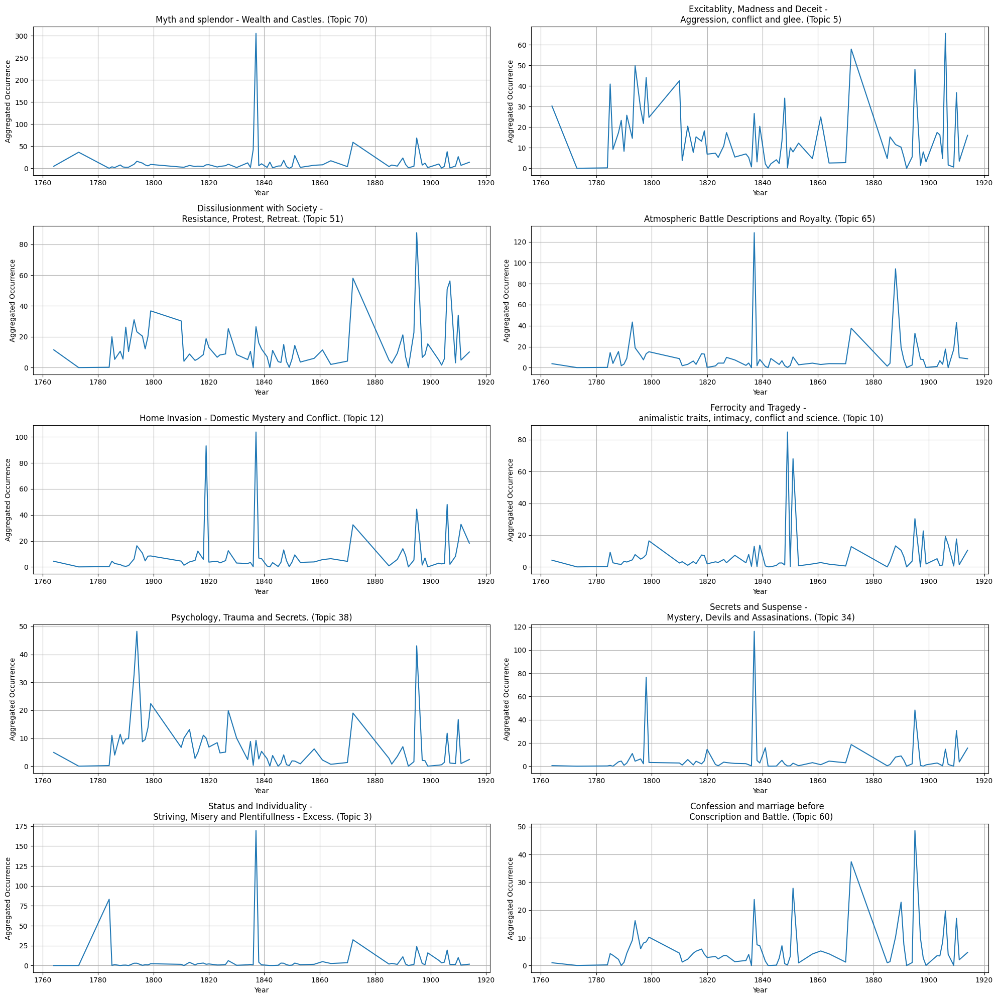

In [14]:
combined_topics = pd.concat([aggregated_topics_top_authors, aggregated_topics_refined_central])

top_10_topics = combined_topics.sum().nlargest(10).index.tolist()

# Time Series
# Aggregating occurrences of each of the 15 topics by year
time_series_data = df[df['author'].isin(top_authors + refined_central_authors)]

# Creating a DataFrame to store the yearly aggregated values for each topic
yearly_topic_aggregation = pd.DataFrame(index=time_series_data['date'].unique(), columns=top_10_topics)

# Aggregating the topics by year
for topic in top_10_topics:
    yearly_data = time_series_data.groupby('date')[topic].sum()
    yearly_topic_aggregation[topic] = yearly_data

# Sorting the index to ensure it's in chronological order
yearly_topic_aggregation.sort_index(inplace=True)

# Setting up the grid for facet wrap
plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(5, 2)  # 5 rows, 2 columns

# Creating individual plots for each of the top 10 topics
for i, topic in enumerate(top_10_topics):
    ax = plt.subplot(gs[i])
    # Retrieve the label from topic_labels, or use the topic name if not found
    label = topic_labels.get(topic, topic)
    ax.plot(yearly_topic_aggregation.index, yearly_topic_aggregation[topic])
    ax.set_title(f"{label} ({topic})")  # Include the label and topic in the title
    ax.set_xlabel('Year')
    ax.set_ylabel('Aggregated Occurrence')
    ax.grid(True)

plt.tight_layout()
plt.show()


The topics 3, 45, 34, 12, 65 and 70 show n aggressive and out of the ordinary spike at around 1837 which is due to the large sway that Hawthorn holds on the corpus in this particular timeframe. Even if most of his texts do not partake too heavily in topic 34. "Vision of the Fountain" is composed of 98% of this topic. Befitting for a text focused on unraveling the message a dreamstate is conveying.
The quite jagged, but strong shift in influence in the 1870ies is caused by Le Fanu, whose main contributing topics 60,12, 51, 70, 65 are heavily affected. Showing how immensly influential his voice is to the most prevalent topics of the corpus. 5, 51, 12, 34, 38, 45 show yet another spike around 1898 due to Corelli and Machen. While Machen, like Le Fanu has a very classical profile fitting the trend, Corelli is highly unique in her distribution of topics. Dealing with fighting, strife and exploration.

Contribution of authors as well as individual works to the most distinct topics and most important topics according to the previous results, as well as the results of the pyLDAvis results of multidimensional scaling

In [10]:
author_topics_comparison = {}

for author in top_authors:
    author_sum_topics = df[df['author'] == author][topic_columns].sum().nlargest(5).index.tolist()
    
    author_median_topics = df[df['author'] == author][topic_columns].median().nlargest(5).index.tolist()
    
    # Store both lists in a dictionary for the author
    author_topics_comparison[author] = {
        'Sum_Topics': author_sum_topics,
        'Median_Topics': author_median_topics
    }

author_topics_comparison

{'Hawthorne, Nathaniel': {'Sum_Topics': ['Topic 70',
   'Topic 3',
   'Topic 65',
   'Topic 56',
   'Topic 12'],
  'Median_Topics': ['Topic 70',
   'Topic 52',
   'Topic 35',
   'Topic 3',
   'Topic 29']},
 'Corelli, Marie': {'Sum_Topics': ['Topic 51',
   'Topic 70',
   'Topic 29',
   'Topic 42',
   'Topic 31'],
  'Median_Topics': ['Topic 51',
   'Topic 29',
   'Topic 42',
   'Topic 70',
   'Topic 31']},
 'Le Fanu, Sheridan': {'Sum_Topics': ['Topic 70',
   'Topic 5',
   'Topic 51',
   'Topic 60',
   'Topic 65'],
  'Median_Topics': ['Topic 70',
   'Topic 51',
   'Topic 5',
   'Topic 12',
   'Topic 39']},
 'Poe, Edgar Allan': {'Sum_Topics': ['Topic 10',
   'Topic 28',
   'Topic 44',
   'Topic 4',
   'Topic 9'],
  'Median_Topics': ['Topic 4', 'Topic 70', 'Topic 10', 'Topic 9', 'Topic 7']},
 'Wharton, Edith': {'Sum_Topics': ['Topic 9',
   'Topic 65',
   'Topic 5',
   'Topic 51',
   'Topic 34'],
  'Median_Topics': ['Topic 65',
   'Topic 5',
   'Topic 70',
   'Topic 51',
   'Topic 34']},
 'B

Excitability, Madness and Deceit (Topic 5) Influence: 10 or 38
There are noticeable spikes throughout the timeline, with a significant peak  at 1800 and 1870. The former encompassing the activities of Radcliff, Shelly and Lewis as some of the founders of the genre, while the latter is due to Stoker, Le Fanu, Poe (+ Related Topics: Wharton, Blackwood, Radcliffe, Mary Shelley, Smith Charlotte, Bierce, Scott Walter, Machen, Ainsworth, Lytton, Brown)

Myth and Splendor - Wealth and Castles (Topic 70) Influence: 4, 7, 65, 1
There's a particularly high peak around the late 1700s, which could correlate with the Romantic movement's interest in the past and the supernatural as seen in the works of authors like Ann Radcliffe and Hawthorne. The decline post-1800 might indicate a shift towards more realistic or psychological narratives. Others like Corelli, Machen, Ainsworth and Stoker picked up the theme later again. (+ Related Topics: Poe, Le Fanu, Wharton, Smith Charlotte, Lee Vernon, Lytton, Brown Charles Brockden, )

Disillusionment with Society (Topic 51) Influence: 19
The topic peaks sharply in the early 1800s and again in the early 1900s, possibly reflecting periods of social upheaval and reform, which might be explored in the works of authors such as Radcliffe, Hawthorne, Le Fanu and Shelley. But also: Corelli, Wharton, Stoker, Scott, Ainsworth, Gaskell

Atmospheric Battle Descriptions and Royalty (Topic 65) Influence: 1, 5, 70
This topic shows a pronounced peak in the early 1800s, aligning with the Napoleonic Wars, which might have influenced Gothic literature's thematic content, as seen in the writings of the era that deal with grand historical events and their aftermath. Relevant for: Le Fanu, Wharton, Smith Charlotte, Lee Vernon, Lytton, Brown Charles Brockden, Stoker (Related Topics: Corelli, Machen, Ainsworth, Le Fanu, Poe)

Home Invasion - Domestic Mystery and Conflict (Topic 12) Influence: 4, 65, 34
The peaks in the early 1800s and early 1900s could reflect societal anxieties about the sanctity of the home and the individual's security during times of social change, a theme evident in the works of Stoker and Le Fanu. (Related Topics: Wharton, Ainsworth)

Ferocity and Tragedy (Topic 10) Influence: 65, 5, 45
The graph shows peaks in the late 1700s and then again in the mid-1800s, which might correspond to periods where themes of primal instincts and the questioning of humanity became prominent, perhaps in response to the Enlightenment and later, the Industrial Revolution. Relevant for Chambers and Brown (Related Topics:Poe, Bierce)

Secrets and Suspense - Mystery, Devils and Assassinations (Topic 34) Influence: 38, 12, 11, 4
There's a notable peak around the 1790s, potentially reflecting the influence of the French Revolution and the rise of Romanticism, with its emphasis on emotion and individual experience, as seen in the works of authors like Radcliffe and Lewis.

Psychology, Trauma and Secrets (Topic 38) Influence: 10, 17, 15 
A steady increase into the 19th century reflects the growing interest in human psychology and the exploration of trauma, possibly influenced by the psychoanalytical theories emerging at the time and explored in Gothic fiction by authors like Poe. 

Status and Individuality - Striving, Misery and Plentifullness - Excess (Topic 3) Influence: 6, 5, 70
The peak in the late 1700s may be associated with the social upheavals of the time, such as the American and French revolutions, which challenged existing hierarchies and social structures, themes explored in the literature of authors like Hawthorne. (Related Topics: Chambers)

Intimacy, Emotions and Identity (Topic 45) Influence: 10, 3, 2
The graph shows a steady presence with a few peaks, particularly in the mid-1800s, which could correspond to a focus on personal relationships and the inner self, possibly explored by authors like Charlotte Brontë or Kipling. (Related Topics: Poe, Bierce)

#### Thematic Grouping and Inter-relationships


1 - 11, 17, 70 - Atmosphere, vast, archaic, refined

2 - 5, 10, 45  - Emotions, Arousal, Fear, Secrecy

3 - 6, 5, 70 - Individualism, Status, Excess

4 - 17, 70, 34 - Myth and Crime

5 - 10, 38 - Aggression and Emotion

6 - 8, 20  - Nature & Reasoning

7 - 2, 19 - Socializing, Courtship

8 - 9, 13 - Faith, Knightood and Knowledge

9 - 8, 16, 65 - Conviction and Adventure

10 - 65, 5, 45 - Intimacy and Conflict, Tragedy

11 - 17, 1, 34 - Doom & Gloom

12 - 4, 65, 34  - Home Invasion

13 - 4, 16, 19 - Rituals, Dance, Magic

14 - 5, 65, 17 - Conflict, Death

15 - 7, 5 - Trickery and Science

16 - 9, 13 - Desecrated Chapel

17 - 4, 11, 14 - Undead, judgement and grief

18 - 4, 17  - Mystery and Adversity

19 - 10, 51, 13  - Forlorn Carnival

20 - 6, 8 - Science and Nature

34 - 38, 12, 11, 4 - Secrets, mystery, Suspense

38 - 10, 17, 15  - Psychology, Trauma, Secrets

45 - 10, 3, 2 - Intimacy, Emotions, Identity

51 - 19  - Dissilusionment with Society

65 - 1, 5, 70 - Battle, Atmosphere, Royalts

70 - 4, 7, 65, 1 - Myth, Wealth, Castles


### Comparison of the influence of all authors on these topics

In [15]:
relevant_topics = [f"Topic {i}" for i in range(1, 21)] + ["Topic 70", "Topic 65", "Topic 51", "Topic 45", "Topic 38", "Topic 34"]
relevant_topics = [topic for topic in relevant_topics if topic in df.columns]

# Aggregate data: Calculate the sum of contributions for each author in each topic
author_topic_contribution = df.groupby('author')[relevant_topics].sum()

# For each topic, find the top 5 contributing authors
top_authors_per_topic = {topic: author_topic_contribution[topic].nlargest(5) for topic in relevant_topics}

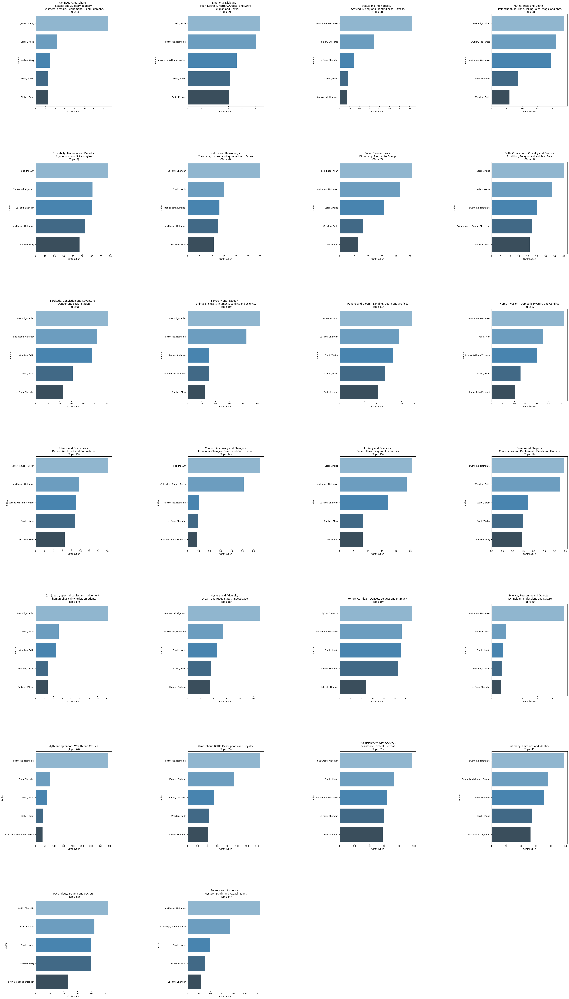

In [14]:
# Adjust the figure and subplots to accommodate all 26 topics (using a 7x4 grid)
fig, axes = plt.subplots(7, 4, figsize=(46, 85))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

for i, (topic, authors) in enumerate(top_authors_per_topic.items()):
    # Check to ensure we don't go out of bounds
    if i < len(axes):
        sns.barplot(ax=axes[i], x=authors.values, y=authors.index, palette="Blues_d", hue=authors.index, legend=False)
        label = topic_labels.get(topic, topic)
        axes[i].set_title(f"{label}\n({topic})")  # Include the label and topic in the title
        axes[i].set_xlabel('Contribution')
        axes[i].set_ylabel('Author')

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

# Increase spacing between plots
fig.subplots_adjust(hspace=0.6, wspace=1.0)
plt.show()


#### Strongest Topic Associations

Henry James Archaic Atmosphere (1)

Wharton -> Gloom and Longing, Blashphemy, Battles & Nature  (11, 16, 65, 6)

Walter Scott -> Gloom and Longing (11)

Corell Marry -> Emotions, Status, Convictions, Institutions, medieval, Mystery,Dances, Social Discontent (2, 3, 8, 15, 18,19, 51)

Radcliffe ->  Emotions, Confict, Madness, Social Discontent (2, 5, 14, 51)

Poe -> Gossip, Gloom,Undead, Mystery, Animals (4, 7, 9, 10, 17)

Bierce Ambrose -> Ferrocious Tragedy (10)

Le Fan -> Madness & Romanticism, Longing, repulsive Intimacy, archaic atmosphere (5, 6, 11, 19, 70, 45)

Blackwood -> Madness, Adventure, Conviction, Dreams and Mystery, Societal Discontent, Identity (5, 9, 18, 51, 45)

Wilde -> Conviction & Death (8)

Keats -> Home Invasion & Mystery and Conflict (12)

Lee Vernon -> Social Pleasantries and Scheming (7)

Stoker -> Home Invasion, Desecration, Dreams & Mystery, Castles & Myth (16, 12, 18, 70)

Hawthorne -> Home Invasion, Witchcraft, Status & Individuality, Deceit & Institutions, Mystery, Meriment (3, 12, 13, 15, 16, 18, 19, 70, 65)

Rymer, James -> Rituals (13)

Machen -> Undead (17)

La Spina Grey -> Festivities, Intimacy and Disgust (19) 

Kippling -> Battles & Royalty (65)

Byron -> Intimacy & Identity (45)

Smith Charlotte -> (38)

Shelley Mary -> Psychological Trauma, Madness & Aggression, Trickery and Science (15, 38, 5)

Colderidge -> Conflicts, Emotions, Secrets and Demons (14, 34)

Brown Charles Brockden -> Psychological Trauma (38)

#### The top texts per topic among the most prevalent topics

In [ ]:
# Aggregate data: Calculate the sum of contributions for each text in each topic
title_topic_contribution = df.groupby('title')[relevant_topics].sum()

# For each topic, find the top 5 contributing texts
top_titles_per_topic = {topic: title_topic_contribution[topic].nlargest(5) for topic in relevant_topics}

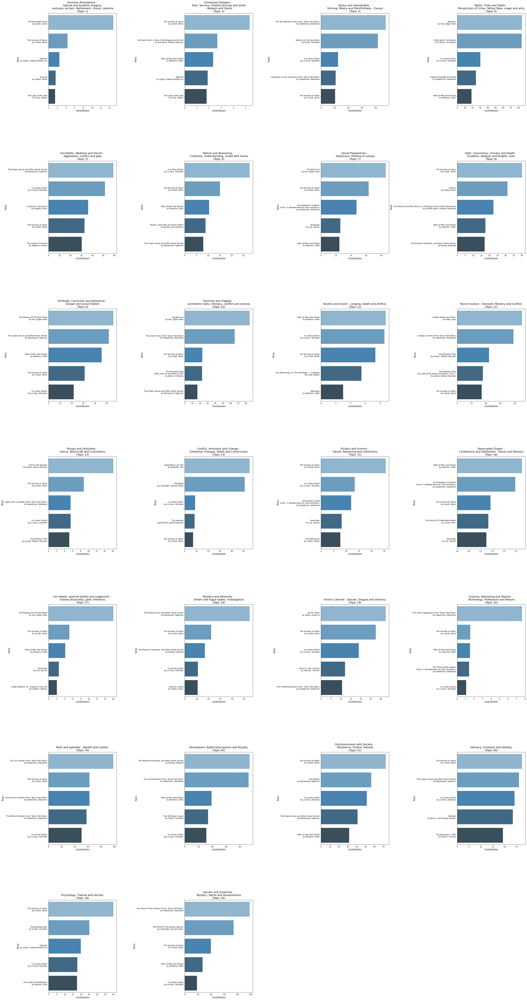

In [26]:
# Aggregate data: Calculate the sum of contributions for each text in each topic
title_topic_contribution = df.groupby(['title', 'author'])[relevant_topics].sum()

# For each topic, find the top 5 contributing texts
top_titles_per_topic = {topic: title_topic_contribution[topic].nlargest(5) for topic in relevant_topics}

fig, axes = plt.subplots(7, 4, figsize=(46, 95))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Setting font sizes for readability
title_fontsize = 14
label_fontsize = 12
tick_fontsize = 10

for i, (topic, titles) in enumerate(top_titles_per_topic.items()):
    # Check to ensure we don't go out of bounds
    if i < len(axes):
        sns.barplot(ax=axes[i], x=titles.values, y=[f"{title[0]}\nby {title[1]}" for title in titles.index], palette="Blues_d", hue=titles.index, legend=False)
        label = topic_labels.get(topic, topic)
        axes[i].set_title(f"{label}\n({topic})", fontsize=title_fontsize) 
        axes[i].set_xlabel('Contribution', fontsize=label_fontsize)
        axes[i].set_ylabel('Texts', fontsize=label_fontsize)
        axes[i].tick_params(labelsize=tick_fontsize)

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

# Adjusting the layout with better spacing
plt.subplots_adjust(hspace=0.6, wspace=1.0)
plt.show()


#### Deviations and additional observations on a comparison of influence on the level of the text

Wharton -> Frightful Dialogue, Myth and Trials, Chivalry & Faith, Rituals & Magic (2,4, 8, 13)

Walpole -> Aggression & Madness (5)

Kippling -> Chivalry & Faith (8)

Shelly Marry -> Gloom, Doom and Longing (11)

Vernon Lee -> Undeath & Grief (17)

Hawthorne -> Myth, Wealth and Castles has three entries by Hawthorne - prime contributer (70) !!!

Moore Thomas -> Intimacy, Identity and Emotions (45)

Parson, Eliza -> Psychological Trauma (38)

Lytton -> Psychological Trauma (38)



#### Gender-Based Analysis

Negative scores for 'f' gender topics indicate that these topics have a lesser distinct association with the 'f' gender compared to their association with the 'm' gender. Positive scores for 'm' gender topics reflect a stronger distinct association with the 'm' gender. This approach focuses on enhancing the distinctiveness of each gender for specific topics, revealing topics where one gender's contribution is relatively more significant than the other's.

This distinctiveness score will be the ratio of the specific contribution of the gender to the total contribution, subtracted from the contribution of all others. A higher score indicates greater distinctiveness. It aims to represents the degree to which a topic is associated with one gender while minimizing the contribution of the other. 

#### Contribution among the leading topics:

In [19]:
# Calculate the total contribution for each topic
total_contributions = df[relevant_topics].sum()

# Calculate specific contributions for genders
specific_contributions = df.groupby('gender')[relevant_topics].sum()

# Calculate distinctiveness score: specific contribution divided by total contribution
distinctiveness_scores = specific_contributions.div(total_contributions)

# Subtracting the sum of contributions of other genders to enhance distinctiveness
for gender in distinctiveness_scores.index:
    other_genders = distinctiveness_scores.index.difference([gender])
    distinctiveness_scores.loc[gender] -= distinctiveness_scores.loc[other_genders].sum()

# Identifying top 5 distinct topics for each gender
top_distinct_topics = {gender: distinctiveness_scores.loc[gender].nlargest(5) for gender in distinctiveness_scores.index}

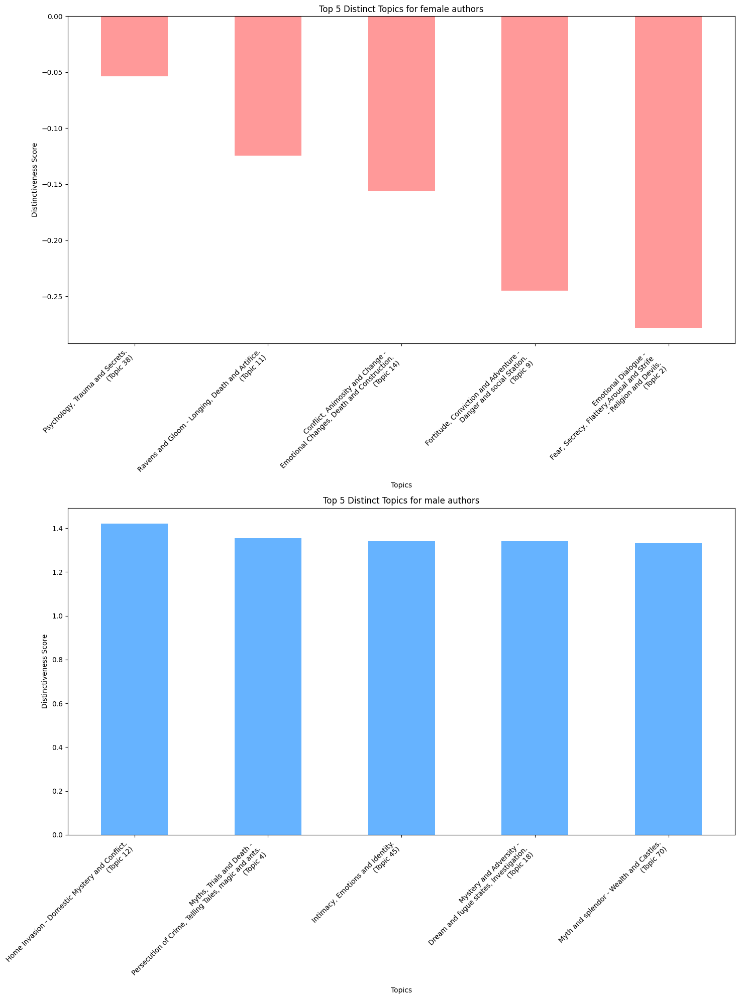

In [ ]:
# Extracting the top 5 distinct topics for genders
top_f_topics = top_distinct_topics['f']
top_m_topics = top_distinct_topics['m']

# Creating bar charts 
fig, axes = plt.subplots(2, 1, figsize=(15, 20))

# Mapping topic names to labels for f
f_topic_labels = [f"{topic_labels.get(topic, topic)}\n({topic})" for topic in top_f_topics.index]

# Top 5 distinct topics for f
top_f_topics.plot(kind='bar', ax=axes[0], color='#ff9999')
axes[0].set_title("Top 5 Distinct Topics for female authors")
axes[0].set_ylabel("Distinctiveness Score")
axes[0].set_xlabel("Topics")
axes[0].set_xticklabels(f_topic_labels, rotation=45, ha='right')  # Set custom x-tick labels

# Mapping topic names to labels for 'm' gender
m_topic_labels = [f"{topic_labels.get(topic, topic)}\n({topic})" for topic in top_m_topics.index]

# Top 5 distinct topics for 'm' gender
top_m_topics.plot(kind='bar', ax=axes[1], color='#66b3ff')
axes[1].set_title("Top 5 Distinct Topics for male authors")
axes[1].set_ylabel("Distinctiveness Score")
axes[1].set_xlabel("Topics")
axes[1].set_xticklabels(m_topic_labels, rotation=45, ha='right')  # Set custom x-tick labels

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


Notably, the scores are negative, indicating these topics are less distinctly associated with the female authorship compared to their association with the male authors. The magnitude of the negative value represents the degree of this lesser association.

#### Contribution among all topics

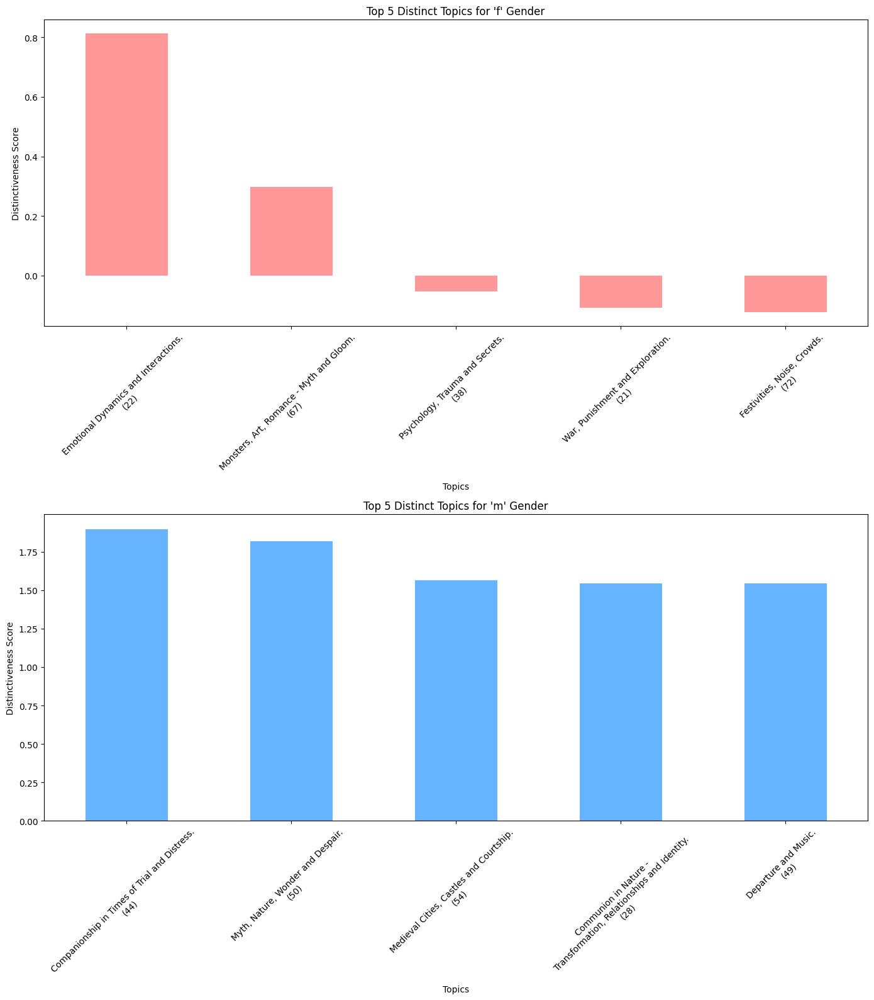

In [ ]:
all_topics = [col for col in df.columns if col.startswith('Topic ')]

# Calculate the total contribution for each topic
total_contributions_all_topics = df[all_topics].sum()

# Calculate specific contributions for each gender for all topics
specific_contributions_all_topics = df.groupby('gender')[all_topics].sum()

# Calculate distinctiveness score for all topics
distinctiveness_scores_all_topics = specific_contributions_all_topics.div(total_contributions_all_topics)

# Subtracting the sum of contributions of other gender to enhance distinctiveness
for gender in distinctiveness_scores_all_topics.index:
    other_genders = distinctiveness_scores_all_topics.index.difference([gender])
    distinctiveness_scores_all_topics.loc[gender] -= distinctiveness_scores_all_topics.loc[other_genders].sum()

# Identifying top 5 distinct topics for each gender for all topics
top_distinct_topics_all_topics = {gender: distinctiveness_scores_all_topics.loc[gender].nlargest(5) for gender in distinctiveness_scores_all_topics.index}

# Extracting the top 5 distinct topics from the full topic range
top_f_topics_all = top_distinct_topics_all_topics['f']
top_m_topics_all = top_distinct_topics_all_topics['m']

fig, axes = plt.subplots(2, 1, figsize=(14, 16))  # Adjusted figsize for a larger graph

# Generate the labels for f with topic number on a new line
f_labels = [f"{topic_labels.get(topic, 'No Label')}\n({topic.split(' ')[-1]})" for topic in top_f_topics_all.index]

# Top 5 distinct topics for f gender (full topic range)
top_f_topics_all.plot(kind='bar', ax=axes[0], color='#ff9999')
axes[0].set_title("Top 5 Distinct Topics for 'f' Gender")
axes[0].set_ylabel("Distinctiveness Score")
axes[0].set_xlabel("Topics")
axes[0].set_xticklabels(f_labels, rotation=45) 

# Generate the labels for m with topic number on a new line
m_labels = [f"{topic_labels.get(topic, 'No Label')}\n({topic.split(' ')[-1]})" for topic in top_m_topics_all.index]

# Top 5 distinct topics for m
top_m_topics_all.plot(kind='bar', ax=axes[1], color='#66b3ff')
axes[1].set_title("Top 5 Distinct Topics for 'm' Gender")
axes[1].set_ylabel("Distinctiveness Score")
axes[1].set_xlabel("Topics")
axes[1].set_xticklabels(m_labels, rotation=45) 

plt.tight_layout()
plt.show()


"Companionship in Times of Trial and Distress."

In [ ]:
# Selecting the top distinct topics for each gender from the full topic range
top_f_topics_list = top_f_topics_all.index.tolist()
top_m_topics_list = top_m_topics_all.index.tolist()

# Function to find the texts with the highest contribution to a given topic
def find_representative_texts(topic, num_texts=3):
    return df.sort_values(by=topic, ascending=False)[['title', 'author', topic]].head(num_texts)

# Finding representative texts for each of the top topics
representative_texts_f = {topic: find_representative_texts(topic) for topic in top_f_topics_list}
representative_texts_m = {topic: find_representative_texts(topic) for topic in top_m_topics_list}

condensed_representative_texts = {
    "f_gender": {topic: texts[['title', 'author']].to_dict(orient='records') for topic, texts in representative_texts_f.items()},
    "m_gender": {topic: texts[['title', 'author']].to_dict(orient='records') for topic, texts in representative_texts_m.items()}
}

condensed_representative_texts

{'f_gender': {'Topic 22': [{'title': 'Hauntings', 'author': 'Lee, Vernon'},
   {'title': 'Hauntings', 'author': 'Lee, Vernon'},
   {'title': 'Arthur Mervyn; Or, Memoirs Of The Year 1793',
    'author': 'Brown, Charles Brockden'}],
  'Topic 67': [{'title': 'Superstition: An Ode', 'author': 'Radcliffe, Ann'},
   {'title': 'The Yellow Wallpaper', 'author': 'Gilman, Charlotte Perkins'},
   {'title': "The Damned Thing\n1898, From 'In the Midst of Life'",
    'author': 'Bierce, Ambrose'}],
  'Topic 38': [{'title': 'The Banished Man', 'author': 'Smith, Charlotte'},
   {'title': 'The Castle Of Wolfenbach', 'author': 'Parsons, Eliza'},
   {'title': 'The Emigrants', 'author': 'Smith, Charlotte'}],
  'Topic 21': [{'title': 'Villette', 'author': 'Brontë, Charlotte'},
   {'title': 'The Yellow Wallpaper', 'author': 'Gilman, Charlotte Perkins'},
   {'title': 'The Grey Woman', 'author': 'Gaskell, Elizabeth'}],
  'Topic 72': [{'title': 'A Beleaguered City, Being A Narrative Of Certain Recent Events In 

It is difficult to pass any judgment on these topics, especially not any readily gender coded one, given that they seem to mirror one another in the general content.
Both groupings share a topic related to some form of entertainment, some associations with traveling, some mythical and fantastical associations and some associations with distress.
Both have topics with associations of romance and emotions. Only a mild differnetiation might be put forth, that the strongly male topics covering emotions have a stronger assiciation with 
Trials, Honor, and with courtship offering a more formal and restrained type of interaction. "Companionship in Times of Trial and Distress." encompasses terms like brood, firmness, accomodate,
acceptance, conducted equilibrium." those carry more oise at that. Meanwhile the topic "Emotional Dynamics and Interactions" with words like "breathless, hug, vociferating, moan, ruffled, brazen"
has a more immediate, unmediated and passionate note to them. 

While none of these gender coded ones are among the most defining topics for the whole corpus, "38 - Psychology Traum and Secrets" is definitely prevalent enough to be ranked among the 20 most 
influencial ones, showing up for Mary Shelly, Charlotte Smith, but also Charles Brockden Brown, Parson Eliza and Edward Bulwer Lyt Lytton as defining elements. Among the most influential texts for this topic
there are also texts by Ann Radcliffe, Marie Corelli, Lee Sophia and many other female authors within the corpus.

The same holds true for "28 - Communion in Nature - Transformation, Relationships and Identity", which can be considered the topic of Romanticists and Decadence writers with texts from Poe, Byron, Wilde and 
Hawthorne contributing most strongly to them.

#### Nationality-Based Analysis

Just as for gender, we will for each topic, calculate a distinctiveness score for each nationality, focusing on minimizing the contribution of other nationalities.

In [ ]:
# Calculate the total contribution for each topic
total_contributions_nationality = df[all_topics].sum()

# Calculate specific contributions for each nationality for all topics
specific_contributions_nationality = df.groupby('nationality')[all_topics].sum()

# Calculate distinctiveness score for all topics for each nationality
distinctiveness_scores_nationality = specific_contributions_nationality.div(total_contributions_nationality)

# Subtracting the sum of contributions of all other nationalities to enhance distinctiveness
for nationality in distinctiveness_scores_nationality.index:
    other_nationalities = distinctiveness_scores_nationality.index.difference([nationality])
    distinctiveness_scores_nationality.loc[nationality] -= distinctiveness_scores_nationality.loc[other_nationalities].sum()

# Identifying top 5 distinct topics for each nationality for all topics
top_distinct_topics_nationality = {nationality: distinctiveness_scores_nationality.loc[nationality].nlargest(5) for nationality in distinctiveness_scores_nationality.index}


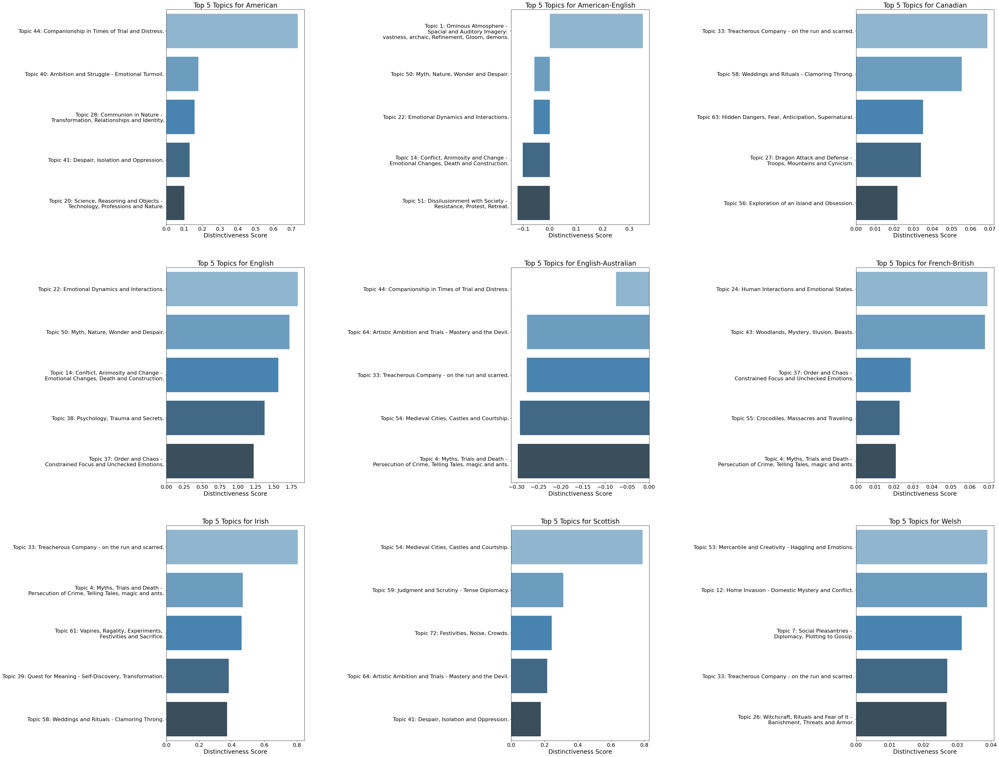

In [ ]:

# Set global parameters for font sizes
plt.rcParams.update({'axes.titlesize': 20,   
                     'axes.labelsize': 18,   # X and Y labels font size
                     'xtick.labelsize': 16,  
                     'ytick.labelsize': 16, 
                     'legend.fontsize': 14}) 

selected_nationalities = list(top_distinct_topics_nationality.keys())[:9]

# Creating subplots in a 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(45, 40))

# Flattening the axes array for easier iteration
axes = axes.flatten()

# Plotting the distinctiveness scores for each selected nationality
for i, nationality in enumerate(selected_nationalities):
    topics_data = top_distinct_topics_nationality[nationality].head(5).reset_index()
    topics_data.columns = ['Topic', 'Distinctiveness Score']
    topics_data['Topic Number'] = topics_data['Topic'].str.extract(r'(\d+)')
    
    # Map the 'Topic Number' to the corresponding labels and include the topic number
    topics_data['Topic Label'] = topics_data['Topic Number'].apply(lambda x: f'Topic {x}: ' + topic_labels.get(f'Topic {x}', f'Topic {x}'))
    
    # Assign 'Topic Label' to hue and disable legend
    sns.barplot(x='Distinctiveness Score', y='Topic Label', data=topics_data, ax=axes[i], palette="Blues_d", hue='Topic Label', legend=False)
    axes[i].set_title(f'Top 5 Topics for {nationality}')
    axes[i].set_xlabel('Distinctiveness Score')
    axes[i].set_ylabel('')
    # Check if legend exists before trying to remove it
    legend = axes[i].get_legend()
    if legend:
        legend.remove()

# Adjusting layout to add space between the columns
fig.subplots_adjust(wspace=1.5) 

plt.show()

In [ ]:
# Function to find the texts with the highest contribution to a given topic for each nationality
def find_representative_texts_nationality(topics, num_texts=3):
    representative_texts = {}
    for nationality, topics_scores in topics.items():
        representative_texts[nationality] = {}
        for topic in topics_scores.index:
            top_texts = df.sort_values(by=topic, ascending=False)[['title', 'author', topic]].head(num_texts)
            representative_texts[nationality][topic] = top_texts.to_dict(orient='records')
    return representative_texts

# Finding representative texts for each of the top topics of each nationality
representative_texts_nationality = find_representative_texts_nationality(top_distinct_topics_nationality)

representative_texts_nationality

{'American': {'Topic 44': [{'title': 'The Tell-Tale Heart',
    'author': 'Poe, Edgar Allan',
    'Topic 44': 94.58},
   {'title': 'In Search of the Unknown',
    'author': 'Chambers, Robert William',
    'Topic 44': 1.64},
   {'title': 'The Narrative Of Arthur Gordon Pym Of Nantucket',
    'author': 'Poe, Edgar Allan',
    'Topic 44': 1.55}],
  'Topic 40': [{'title': "Fancy's Show-Box (From 'Twice Told Tales')",
    'author': 'Hawthorne, Nathaniel',
    'Topic 40': 50.5},
   {'title': 'The Italian, Or, The Confessional Of The Black Penitents. A Romance',
    'author': 'Radcliffe, Ann',
    'Topic 40': 5.33},
   {'title': "Snow Flakes (From 'Twice Told Tales')",
    'author': 'Hawthorne, Nathaniel',
    'Topic 40': 2.66}],
  'Topic 28': [{'title': 'The Oval Portrait',
    'author': 'Poe, Edgar Allan',
    'Topic 28': 96.28},
   {'title': 'The Phantom Rickshaw, and Other Ghost Stories',
    'author': 'Kipling, Rudyard',
    'Topic 28': 14.09},
   {'title': 'In Search of the Unknown',
  

The overwhelming majority of the contributions of distinctly American voices seem to be bound to the strongly masculine topics about poise, but also the one about Romanticism
we had previously uncovered, with an overwhelming influence being Poe, Chambers, Brown and Hawthorne, even if the most highly associated one of them somehow ranking 
"The Tell-Tale-Heart" which quizically subverts the posed expectations.

The distinctly British voices arry a much stronger weight than any of the other nationalities, with two of them rrising form the list of distinctly female topics:
"22 - Emotional Dynamics and Interactions" and "38 - Psychology, Trauma and Secrets", while 38 has a very dense rate of Mary Shelly and Ann Radcliffe texts,
22 is a very diverse topic in terms authors contributing to it, but the topic carries a strong heterogeneitiy with regards to nationality.
As mentioned above, it carries with it a lot of strongly passionate vocabluary with the highes contribution by Lee Vernon's "Hauntings" or Godwin's "The Adventures of Caleb Williams".

#### Connection between sentiment and different topics:

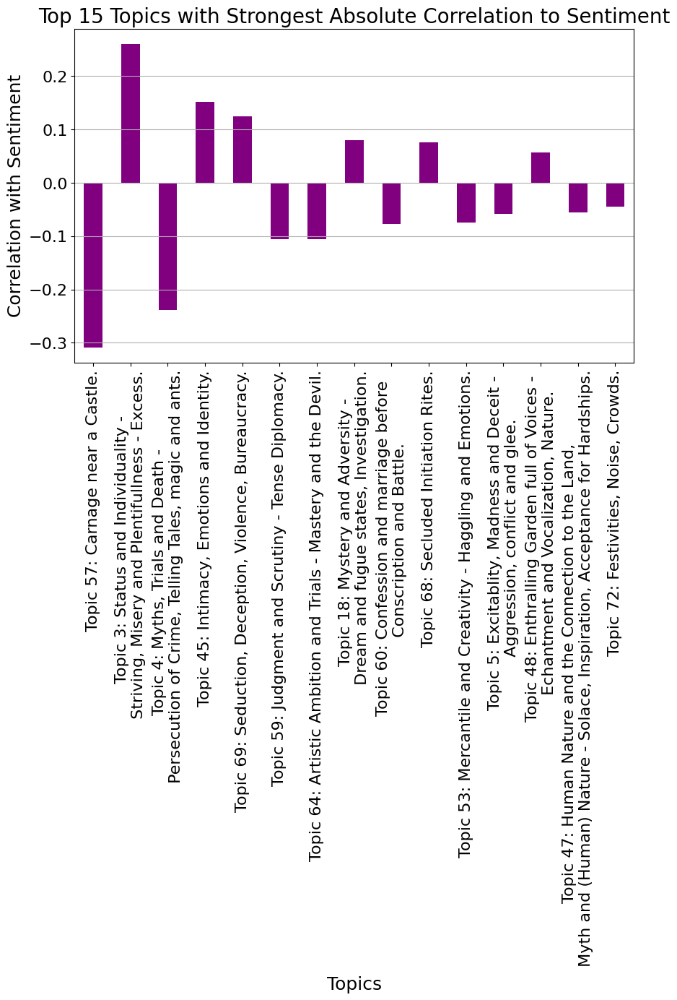

In [ ]:
all_topics_sentiment_correlations = df[all_topics + ['sentiment']].corr()['sentiment'].drop('sentiment')

# Selecting the 15 topics with the strongest absolute correlation (considering both positive and negative)
strongest_absolute_correlations = all_topics_sentiment_correlations.abs().nlargest(15)
selected_strongest_absolute_topics = strongest_absolute_correlations.index.tolist()

# Creating a list of labels with topic numbers and labels for the selected topics using the mapping dictionary
selected_labels_with_numbers = [f'{topic}: {topic_labels.get(topic, "Label not found")}' for topic in selected_strongest_absolute_topics]

# Visualization of the correlation for these 15 topics
plt.figure(figsize=(10, 6))
all_topics_sentiment_correlations[selected_strongest_absolute_topics].plot(kind='bar', color='purple')

# Replace the X-axis tick labels with the selected labels
plt.xticks(range(len(selected_labels)), selected_labels_with_numbers, rotation=90)

plt.title('Top 15 Topics with Strongest Absolute Correlation to Sentiment')
plt.xlabel('Topics')
plt.ylabel('Correlation with Sentiment')
plt.grid(axis='y')

# Show the plot
plt.show()

The connection between sentiment and differnt topics is not particulary strong, but in those cases where it is present the connection seems very natural and intuitive,
with texts that ean strongly towards topics that mark carnage, crime, death and tense judgments being leaning towards a more negative sentiment, while those focusing on self-expression, ambition intimacy seduction leaning towards a positive sentiment.

But given that only three entries have a higher value than 0,1 the connections are not overly strong to begin with.

#### Distribution of Topics among Periods, Text Sources and Roles 

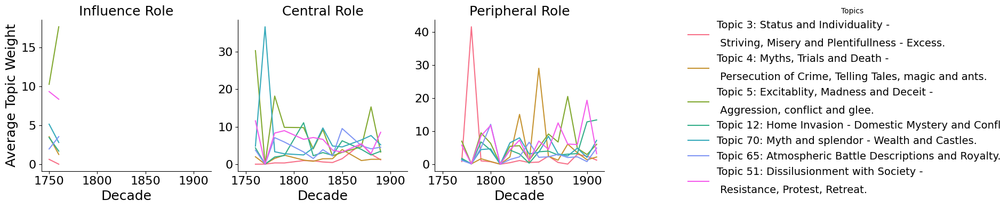

In [ ]:
df_per = df_txt_features_LDA.copy()

df_per['date'] = pd.to_numeric(df_per['date'], errors='coerce')
df_per = df_per.dropna(subset=['date'])

# Extract the decade from the 'date' and create a new column for it
df_per['decade'] = (df_per['date'] // 10 * 10).astype(int)

# Define the relevant topics as specified
relevant_topics = [f"Topic {i}" for i in range(1, 21)] + ["Topic 70", "Topic 65", "Topic 51", "Topic 45", "Topic 38", "Topic 34"]


decade_grouped = df_per.groupby('decade')[topic_columns].mean()

# Identifying topics that have a peak value greater than 8
peaking_topics = [topic for topic in topic_columns if decade_grouped[topic].max() > 8]

agg_topics_by_decade_role = df_per.groupby(['decade', 'role'])[topic_columns].mean().reset_index()

# Filter the relevant topics list to include only those peaking topics
filtered_relevant_topics = [topic for topic in relevant_topics if topic in peaking_topics]

palette = sns.color_palette("husl", n_colors=len(filtered_relevant_topics))

# Creating a facet grid for the filtered topics, overlaying all topics in each linechart
g = sns.FacetGrid(agg_topics_by_decade_role, col="role", col_wrap=3, height=4, sharey=False, palette="viridis")

for i, topic in enumerate(filtered_relevant_topics):
    # Map the topic number to its label
    topic_label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    g = g.map_dataframe(sns.lineplot, x="decade", y=topic, color=palette[i], label=topic_label)


# Add a legend with the topic labels instead of the numbers
g.add_legend(title="Topics")

# Adjust the legend to display full topic labels if necessary
for text, topic in zip(g._legend.texts, filtered_relevant_topics):
    text.set_text(f'{topic}: {topic_labels.get(topic, "Label not found")}')

g._legend.set_bbox_to_anchor((1.05, 0.5))
plt.setp(g._legend.get_texts(), linespacing=2)

g.set_axis_labels("Decade", "Average Topic Weight")
g.set_titles(col_template="{col_name} Role")

plt.show()

This only strengthens the impression of how central 5, 51, 70 and 65 are, even 3 had faded into the background in previous comparisons.

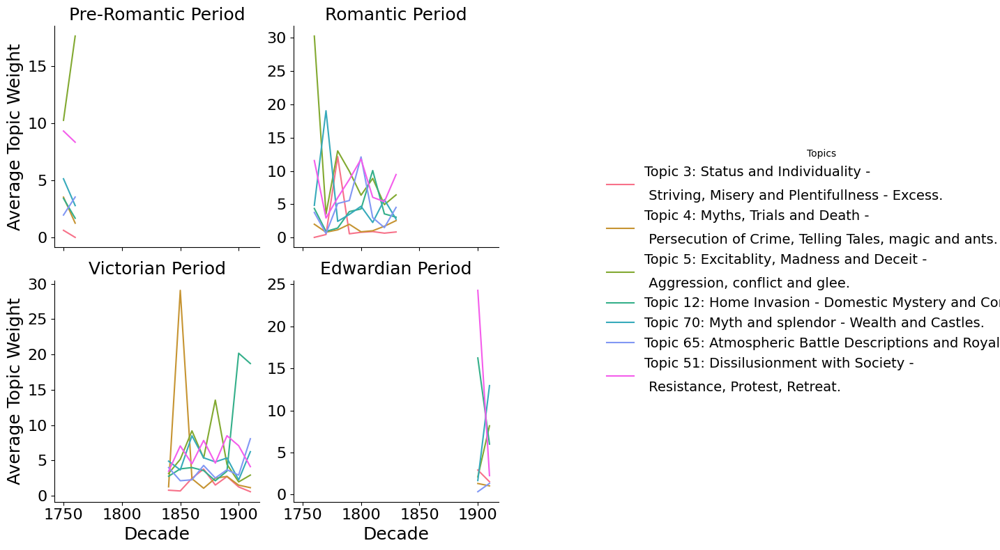

In [ ]:
agg_topics_by_decade_period = df_per.groupby(['decade', 'period'])[topic_columns].mean().reset_index()

palette = sns.color_palette("husl", n_colors=len(filtered_relevant_topics))

# Creating a facet grid for each period, overlaying all filtered relevant topics in each linechart
g = sns.FacetGrid(agg_topics_by_decade_period, col="period", col_wrap=2, height=4, sharey=False, palette=palette)

# Map each topic to a line in the grid and include both the topic number and label in the legend
for i, topic in enumerate(filtered_relevant_topics):
    topic_label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    g = g.map_dataframe(sns.lineplot, x="decade", y=topic, color=palette[i], label=topic_label)

g.add_legend(title="Topics")
g._legend.set_bbox_to_anchor((1.05, 0.5))
plt.setp(g._legend.get_texts(), linespacing=2)

g.set_axis_labels("Decade", "Average Topic Weight")
g.set_titles(col_template="{col_name} Period")

plt.show()

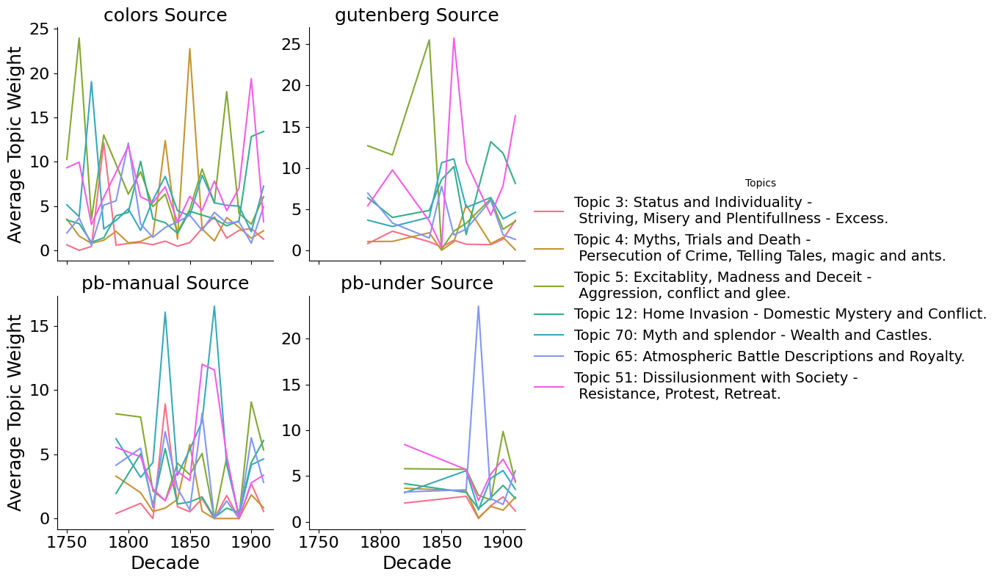

In [ ]:
# Aggregating the topic distributions by decade and source
agg_topics_by_decade_source = df_per.groupby(['decade', 'source'])[topic_columns].mean().reset_index()

# Creating a facet grid for each source, overlaying all filtered relevant topics in each linechart
g = sns.FacetGrid(agg_topics_by_decade_source, col="source", col_wrap=2, height=4, sharey=False, palette=palette)
# Map each topic to a line in the grid and include both the topic number and label in the legend
for i, topic in enumerate(filtered_relevant_topics):
    topic_label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    g = g.map_dataframe(sns.lineplot, x="decade", y=topic, color=palette[i], label=topic_label)

# Adjusting plot labels and adding a legend for different topics
g.add_legend(title="Topics")
g.set_axis_labels("Decade", "Average Topic Weight")
g.set_titles(col_template="{col_name} Source")
plt.show()

### Cluster Analysis

We will have a look at the relationship between the texts with regards to their topic distributions as features. For this we will use Principal component analysis on the topic columns and and K-Means clustering on the results to group them into categories

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:753: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:591: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:600: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



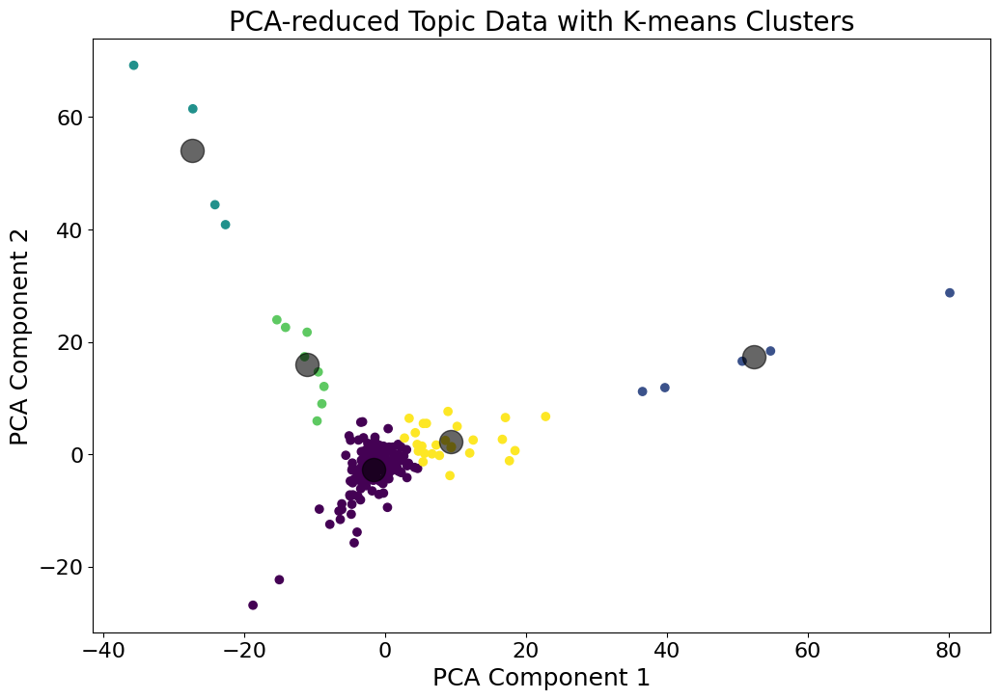

In [ ]:
df_clu = df_txt_features_LDA.copy()

# Selecting only the topic distribution columns for clustering
topic_data = df_clu[topic_columns]

# Using PCA for dimensionality reduction
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(topic_data)

# Applying K-means clustering
kmeans = KMeans(n_clusters=5) 
kmeans.fit(reduced_data)
labels = kmeans.predict(reduced_data)

df_clu['cluster'] = labels

# Plotting the results
plt.figure(figsize=(12, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', marker='o')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=300, alpha=0.6)
plt.title('PCA-reduced Topic Data with K-means Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

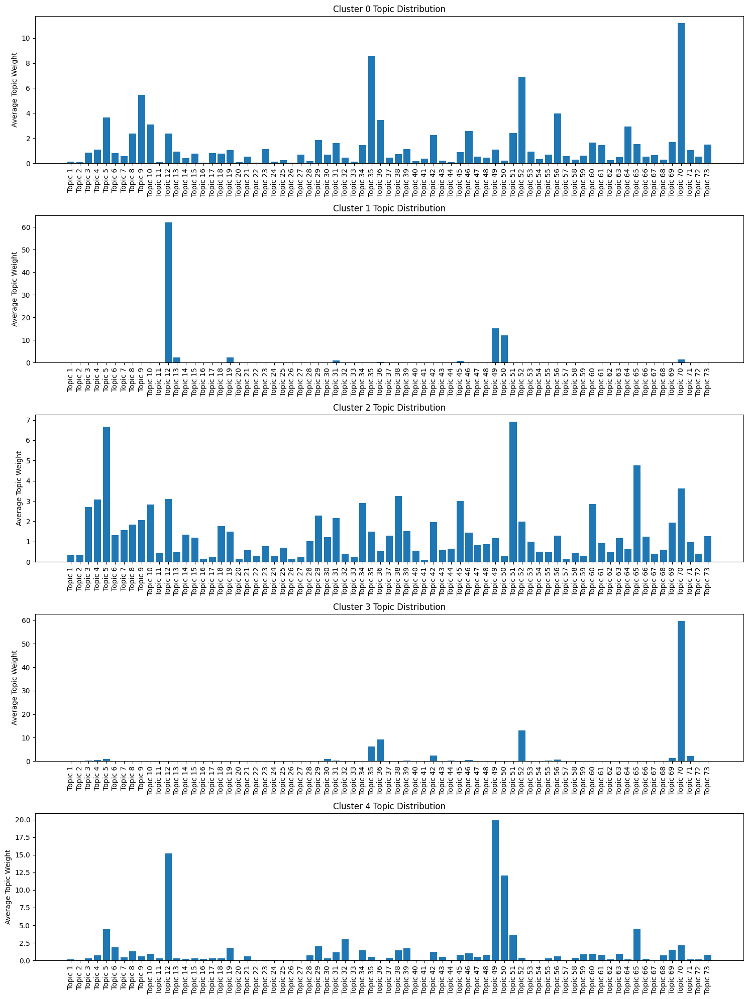

In [ ]:
# Plotting the topic distributions for each cluster
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(15, 20))

for i in range(5):  
    cluster_data = df_clu[df_clu['cluster'] == i][topic_columns].mean()
    axs[i].bar(x=cluster_data.index, height=cluster_data.values)
    axs[i].set_title(f'Cluster {i} Topic Distribution')
    axs[i].set_ylabel('Average Topic Weight')
    axs[i].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

Let us have a closer look at the outliers

In [ ]:
# Counting the number of texts in each cluster
cluster_counts = df_clu['cluster'].value_counts()

# Creating a dictionary with clusters as keys and references as values
cluster_references_dict = df_clu.groupby('cluster')['reference'].apply(list).to_dict()

# Filtering the dictionary to include only the three smallest clusters
# Sorting clusters by their size to identify the three smallest
smallest_clusters = cluster_counts.nsmallest(3).index
smallest_cluster_references = {cluster: cluster_references_dict[cluster] for cluster in smallest_clusters}

# Printing the references for the three smallest clusters
smallest_cluster_references


{1: ['Hawthorne_SundayatHo_1',
  'Jacobs_TheMonkeyS_1',
  'Jacobs_TheMonkeys_1',
  'Keats_LaBelleDam_1'],
 3: ['Aikin_SirBertran_1',
  'Hawthorne_LittleAnni_1',
  'Hawthorne_TheLilysQu_1',
  'Hawthorne_TheMiniste_1',
  'Hawthorne_TheWhiteOl_1'],
 4: ['Bangs_GhostsIHav_1',
  'Bierce_AnOccurren_1',
  'Holcroft_AnnaStIves_1',
  'Lewis_AlonzoTheB_1',
  'Machen_TheHouseof_1',
  'Stagg_TheVampyre_1',
  'Stoker_TheLairOfT_1',
  'unsigned_CountRoder_1']}

The grouping into clusters shows a even distribution of topics into two groups with a smaller thrid party that has a much narrower distribution that focuses on a few specific topics, but their more narrower focus on fewer topics is concentrated on a few oics, but of those two carry exceptional weight on the corpus as a whole: 70 "Myth and splendor - Wealth and Castles" and 12 "Home Invasion - Domestic Mystery and Conflict", with 12 being particularly focused in its influence on a select few influencial authors that stand a part: XXXX

The importance of 70 might on the otherhand reflect its weight on some of the major voices within the corpus, such as Hawthorne and Mary Corell.

Further important influences to investigate aretopics 49 - "Departure and Music", 50 - "Myth, Nature, Wonder and Despair" and to a lesser degree 51 - "Dissilusionment with Society - \n Resistance, Protest, Retreat".

Closer inspection is warranted for he pares cluster  with only a few entries for 35 - "Mental Illness, Law and Outcasts - Fear, Suspicion and Struggles", 36 - "Individualism vs. Conformity - Rebellion and Social Norms", 52 - "Adventure, Spendor, Power and Challenges, History" and lot of weight onto 70.



Furhter investigation into the major texts for these topics and the relationship of these texts to one another or to the genre as a whole is warranted.

#### Hierarchical Clustering

Now we will have a look at the result of hierarchical clustering of topics based on their distribution similarity.

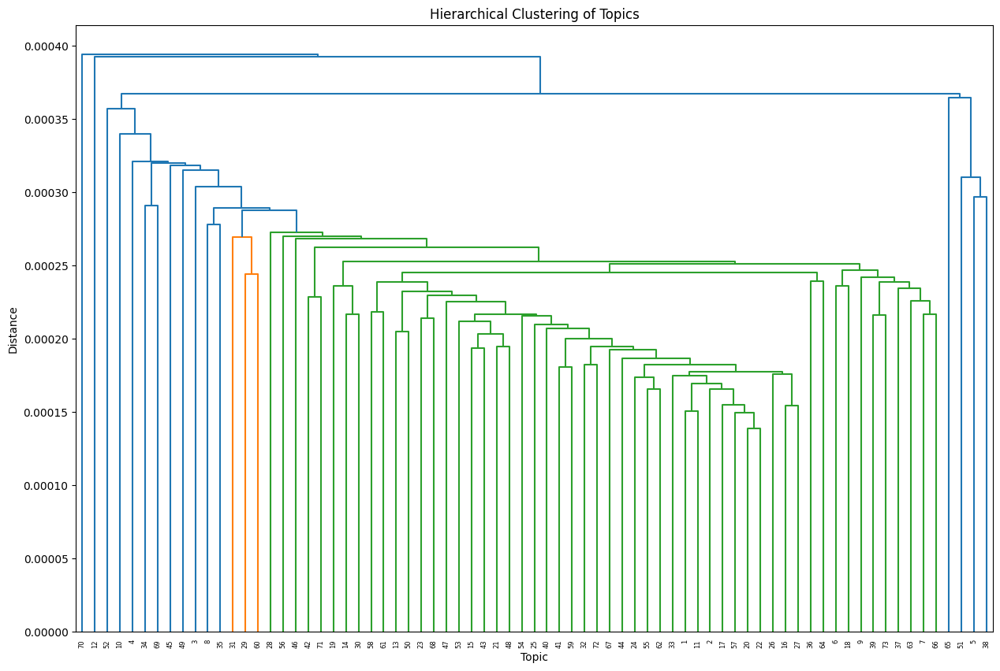

In [ ]:
# Cmpute Jensen-Shannon divergence, the metric also in use in pyLDAVis
def jensen_shannon_divergence(p, q):
    """
    Compute the Jensen-Shannon divergence between two probability distributions.
    """
    p = np.asarray(p)
    q = np.asarray(q)
    m = (p + q) / 2
    return (entropy(p, m) + entropy(q, m)) / 2

# Compute the distance matrix using Jensen-Shannon divergence
dist_matrix = pdist(topic_term_dists_LDA, metric=jensen_shannon_divergence)

# Perform hierarchical clustering
linkage_matrix = linkage(dist_matrix, method='average')

plt.figure(figsize=(15, 10))
dendrogram(linkage_matrix, labels=range(1, len(topic_term_dists_LDA) + 1))
plt.title('Hierarchical Clustering of Topics')
plt.xlabel('Topic')
plt.ylabel('Distance')
plt.show()


Here the grouping seems to create two outgroups composed of 31 - "Exploration, Gloom, Caverns",a very neiche topic with little weight on the larger whole, 29 - "Bickering, Fighting and Mountains", a highly concentrated topic with impect on the wider grouping and 60 - "Confession and marriage before  Conscription and Battle" also a very niche topic with litte weight to it.

The other outgroup cluster is composed of 65 - "Atmospheric Battle Descriptions and Royalty", 51 - "Dissilusionment with Society - Resistance, Protest, Retreat", 5 - "Excitablity, Madness and Deceit -  Aggression, conflict and glee" and 38 - "Psychology, Trauma and Secrets". The latter posing a very powerful group of topics that carry a large weight on the corpus within a small selection.

This still requires delving deeper into its connections as well.

#### Correlation Heatmap

The following correlation matrix covers the attributes 'gender', 'nationality', 'source', 'sentiment', 'period', 'mode', 'genre','role', 'cluster' and a binary indication of high or low topic values for each topic 

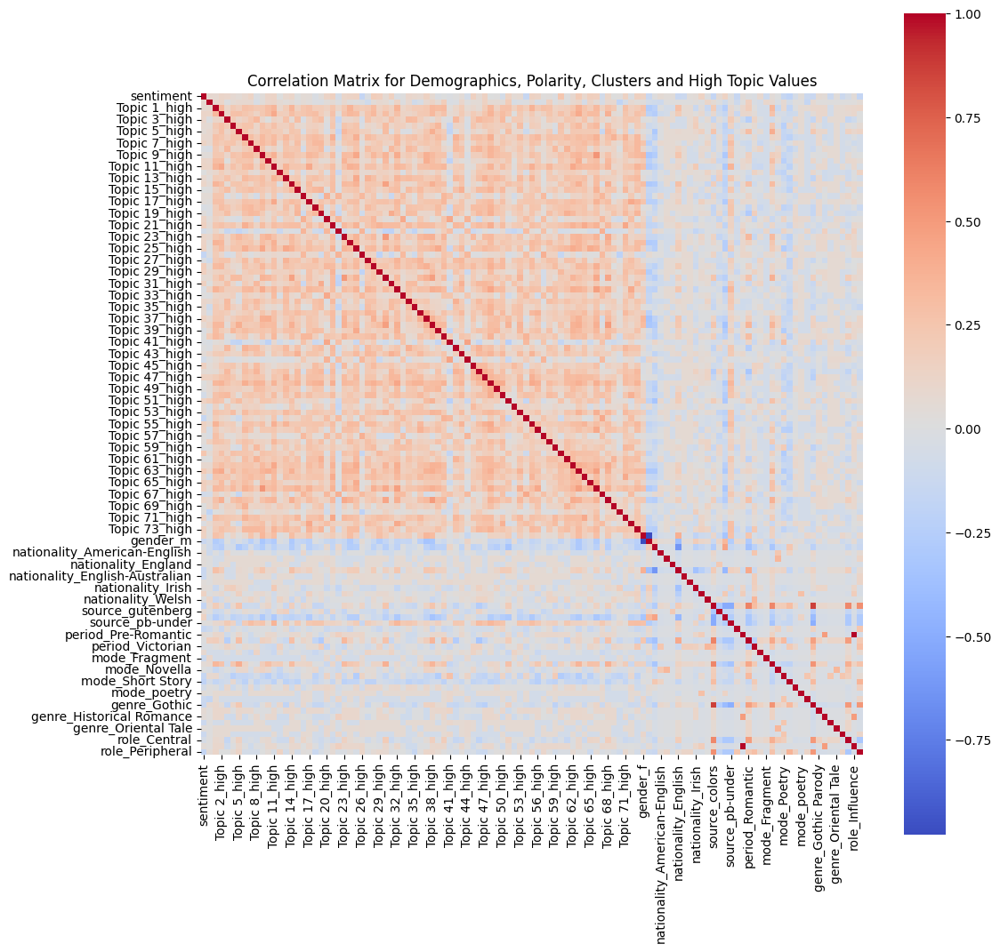

In [ ]:
# Calculating the median for each topic and creating binary variables for high/low values
topic_medians = df_clu[topic_columns].median()
for topic in topic_columns:
    df_clu[f'{topic}_high'] = df_clu[topic] > topic_medians[topic]

# Selecting the columns of interest for correlation analysis
columns_of_interest = ['gender','nationality', 'source', 'sentiment',
                       'period', 'mode', 'genre', 'role', 'cluster'] + [f'{topic}_high' for topic in topic_columns]

# Creating a new dataframe with these columns
analysis_df = df_clu[columns_of_interest]

# Converting categorical variables to dummy variables for correlation analysis
analysis_df_dummies = pd.get_dummies(analysis_df, columns=['gender', 'nationality', 'source', 'period', 'mode', 'genre', 'role'])

# Calculating the correlation matrix
correlation_matrix = analysis_df_dummies.corr()

# Visualizing the correlation matrix
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, cmap='coolwarm', square=True)
plt.title('Correlation Matrix for Demographics, Polarity, Clusters and High Topic Values')
plt.show()

#### Network Analysis:

The following network analysis deals with influence among texts, with the intentn of establishing influence and similarity among authors.
For this pairwise similarity between documents based on topic distributions using cosine similarity is used.

Nodes will represent the documents. Edges will represent the similarity between documents, potentially with a threshold to filter out low-similarity connections.

Network Analysis:Analyze the network to find clusters of similar texts, centrality measures, and other network characteristics.

In [ ]:
df_net = df_txt_features_LDA.copy()
topic_columns = [col for col in df_net.columns if col.startswith('Topic ')]
# Set seed for Python's built-in random number generator
random.seed(3)
# Set seed for NumPy's random number generator
np.random.seed(3)

#### Network of overall similarity of texts

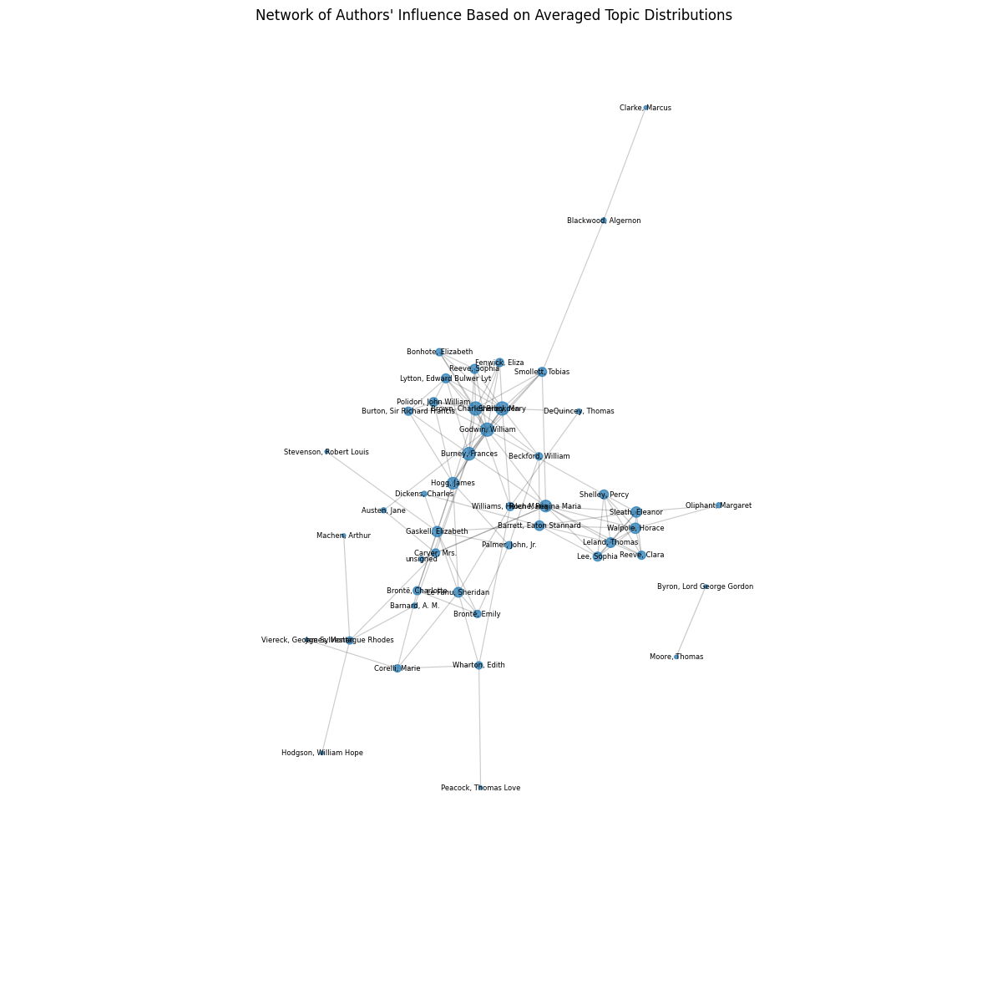

In [ ]:
# Group by 'author' and calculate the mean for each topic column
author_topics = df_net.groupby('author')[topic_columns].mean().reset_index()

# Recalculate the cosine similarities based on the averaged topic distributions
similarity_matrix = cosine_similarity(author_topics[topic_columns])

# Since the similarity matrix is symmetric, we'll fill the diagonal with np.nan to avoid self-loops
np.fill_diagonal(similarity_matrix, np.nan)

# Define a similarity threshold
similarity_threshold = 0.85

# Initialize an undirected graph
G = nx.Graph()

# Add nodes to the graph, using authors as the node identifier
for idx, row in author_topics.iterrows():
    G.add_node(row['author'], author=row['author'])

# Add edges based on the similarity threshold and the averaged topic distribution
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if similarity_matrix[i][j] >= similarity_threshold:
            author_i = author_topics.iloc[i]['author']
            author_j = author_topics.iloc[j]['author']
            G.add_edge(author_i, author_j, weight=similarity_matrix[i][j])

# Nodes
node_sizes = [10 * G.degree(n) for n in G.nodes()]

# Edges
edges = G.edges()
weights = [G[u][v]['weight'] for u,v in edges]

# Labels
labels = {author: author for author in author_topics['author']}

# Label only the most central nodes to reduce label overlap
degree_dict = dict(G.degree(G.nodes()))
central_nodes = [node for node in degree_dict if degree_dict[node] >= np.percentile(list(degree_dict.values()), 50)]  # Adjust threshold as needed
central_labels = {node: labels[node] for node in central_nodes}

# Use the Spring layout for a more spread out layout
pos = nx.spring_layout(G, k=0.15, iterations=20, seed=5) 

# Now we'll draw the graph with the new positions and labels
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, alpha=0.2)
nx.draw_networkx_labels(G, pos, labels=central_labels, font_size=6)

plt.title("Network of Authors' Influence Based on Averaged Topic Distributions")
plt.axis('off') 
plt.show()


#### Averaging the Distribution on the features of all text segments

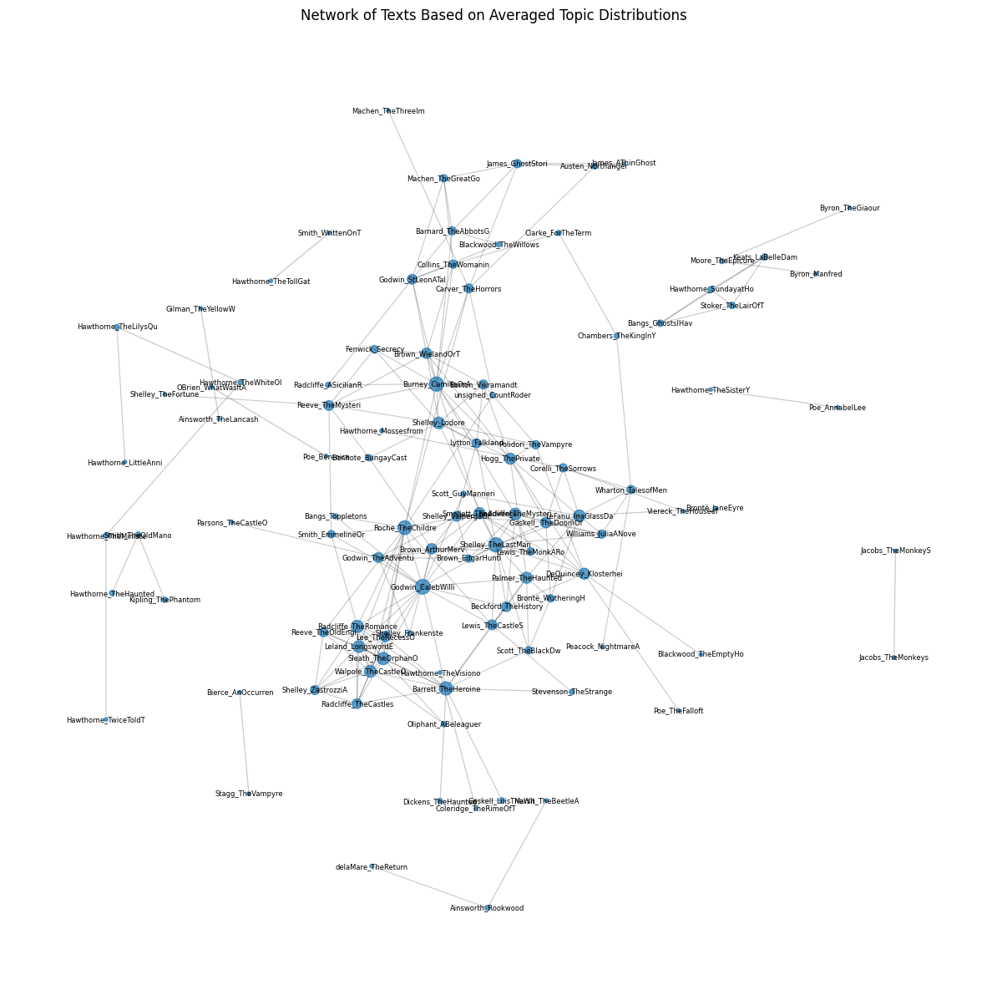

In [ ]:
# Group by 'text_key' and calculate the mean for each topic column
text_key_topics = df_net.groupby('text_key')[topic_columns].mean().reset_index()

# Recalculate the cosine similarities based on the averaged topic distributions
similarity_matrix = cosine_similarity(text_key_topics[topic_columns])

# Since the similarity matrix is symmetric, we'll fill the diagonal with np.nan to avoid self-loops
np.fill_diagonal(similarity_matrix, np.nan)

# Define a similarity threshold
similarity_threshold = 0.85

# Initialize an undirected graph
G = nx.Graph()

# Add nodes to the graph, using text_keys as the node identifier
for idx, row in text_key_topics.iterrows():
    G.add_node(idx, text_key=row['text_key'])

# Add edges based on the similarity threshold and the averaged topic distribution
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if similarity_matrix[i][j] >= similarity_threshold:
            text_key_i = text_key_topics.iloc[i]['text_key']
            text_key_j = text_key_topics.iloc[j]['text_key']
            G.add_edge(text_key_i, text_key_j, weight=similarity_matrix[i][j])

# Nodes
node_sizes = [10 * G.degree(n) for n in G.nodes()]

# Edges
edges = G.edges()
weights = [G[u][v]['weight'] for u, v in edges]

# Labels - using the 'text_key' as labels
# Create labels for all nodes in the graph, using 'text_key' as labels
labels = {row['text_key']: row['text_key'] for idx, row in df_net.iterrows()}

# Creating labels only for the most central nodes
degree_dict = dict(G.degree(G.nodes()))
central_nodes = [node for node in degree_dict if degree_dict[node] >= np.median(list(degree_dict.values()))]

# When creating central_labels, ensure that the node exists in labels
central_labels = {node: labels[node] for node in central_nodes if node in labels}


# Use the Spring layout for a more spread out layout
pos = nx.spring_layout(G, k=0.15, iterations=20, seed=5) 

# Now we'll draw the graph with the new positions and labels
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, alpha=0.2)
nx.draw_networkx_labels(G, pos, labels=central_labels, font_size=6)

plt.title("Network of Texts Based on Averaged Topic Distributions")
plt.axis('off')
plt.show()


#### Tracing Influence across the network

For this similarity shall be evaluated betwen all sections of a text equally, only its most prominent topics will be compared with the rest of the network and similarity will only be evaluated unilateraly from the older to the newer texts.

In [ ]:
unique_text_keys = df_net['text_key'].unique()

topic_columns = [col for col in df_net.columns if col.startswith('Topic')]

# Create a new DataFrame to store the top 10 topics for each text segment
top_topics_list = []

# Iterate over each row in the DataFrame
for index, row in df_net.iterrows():
     # Sort the topics for this row and select the top 10
    sorted_topics = row[topic_columns].sort_values(ascending=False).head(10)
    
    # Create a dictionary of the top 10 topics
    top_topics_dict = sorted_topics.to_dict()

    # Add the dictionary to the list
    top_topics_list.append(top_topics_dict)

# Convert the list of dictionaries to a DataFrame
top_topics_df = pd.DataFrame(top_topics_list)
top_topics_df = top_topics_df.fillna(0)

In [ ]:
# Function to calculate cosine similarity
def calculate_similarity(df):
    # Convert DataFrame to numpy array for similarity calculation
    matrix = df.to_numpy()

    sim_matrix = cosine_similarity(matrix)

    return sim_matrix

# Nullify all columns except the top ten topics for similarity calculation
similarity_matrix = calculate_similarity(top_topics_df)

# Initialize a directed graph
G = nx.DiGraph()

# Add nodes with text_key as label and date as attribute
for text_key in unique_text_keys:
    # Extract the date for this text_key
    date = df_net[df_net['text_key'] == text_key]['date'].iloc[0]
    G.add_node(text_key, date=date)

In [ ]:
#Adding Edges
similarity_threshold = 0.75

# Creating a dictionary for quick access to text_key indices
text_key_to_index = {text_key: i for i, text_key in enumerate(unique_text_keys)}

# Iterate over each pair of text segments
for i, text_key1 in enumerate(unique_text_keys):
    for j, text_key2 in enumerate(unique_text_keys):
        if i != j:
            # Check if similarity is above the threshold
            if similarity_matrix[i, j] >= similarity_threshold:
                # Determine the direction of the edge based on the date
                date1 = df_net[df_net['text_key'] == text_key1]['date'].iloc[0]
                date2 = df_net[df_net['text_key'] == text_key2]['date'].iloc[0]

                if date1 < date2:
                    # Add edge from older text to newer text
                    G.add_edge(text_key1, text_key2, weight=similarity_matrix[i, j])
                elif date1 == date2:
                    # Add bilateral edges for texts from the same year
                    G.add_edge(text_key1, text_key2, weight=similarity_matrix[i, j])
                    G.add_edge(text_key2, text_key1, weight=similarity_matrix[j, i])

# Sort nodes by degree centrality (highest centrality first)
sorted_nodes = sorted(G.nodes(), key=lambda node: degree_centrality[node], reverse=True)

# Create a mapping of numbers to sorted node references
node_labels = {node: i for i, node in enumerate(sorted_nodes)}
# Create a reverse mapping for the legend
label_to_node = {i: node for node, i in node_labels.items()}

# Adjust node sizes based on degree
node_sizes = [G.degree(node) * 100 for node in sorted_nodes]

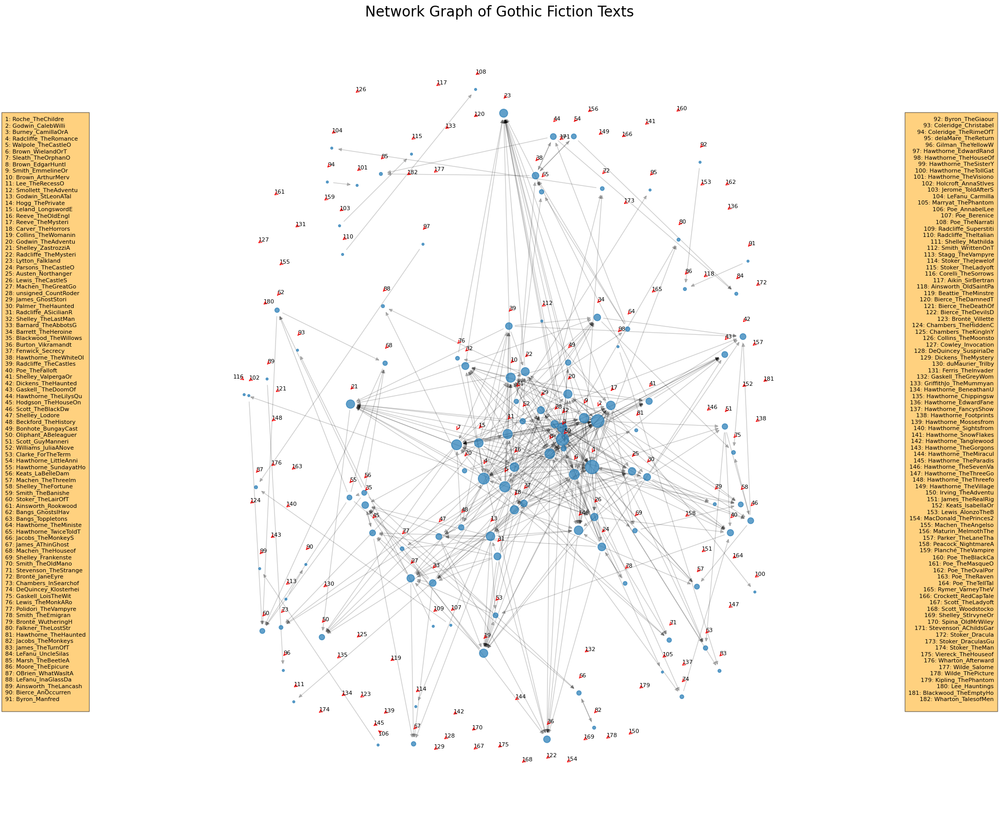

In [ ]:
# Calculate the cumulative weight for edges where multiple connections exist
for u, v, data in G.edges(data=True):
    # Since it's a directed graph, we need to check both directions
    if G.has_edge(v, u):
        total_weight = data['weight'] + G[v][u]['weight']
        G[u][v]['weight'] = total_weight
        G[v][u]['weight'] = total_weight

# Calculate centrality measures
degree_centrality = nx.in_degree_centrality(G) 

# Storing these measures as node attributes for later use
for node, centrality in degree_centrality.items():
    G.nodes[node]['degree_centrality'] = centrality

# Detect communities using the Louvain method
partition = community_louvain.best_partition(G.to_undirected())

# Add community info to node attributes
for node, comm_id in partition.items():
    G.nodes[node]['community'] = comm_id
    
# Use colors for different communities
community_colors = [partition[node] for node in G.nodes()]

# Adjust node sizes to reflect centrality measures
node_sizes = [v * 1000 for v in degree_centrality.values()] 


# Calculate degree centrality
centrality = nx.degree_centrality(G)

# Sort nodes by centrality (more central nodes get lower numbers)
sorted_nodes = sorted(G.nodes, key=lambda node: centrality[node], reverse=True)

# Assign numbers to nodes based on sorted order
numbered_labels = {node: i+1 for i, node in enumerate(sorted_nodes)}

# Use the spring layout for visualization
pos = nx.spring_layout(G, k=0.25, iterations=20, seed=42)

# Draw the graph
plt.figure(figsize=(20, 20))
nx.draw_networkx_edges(G, pos, alpha=0.2)
nx.draw_networkx_nodes(G, pos, node_size=[10 * G.degree(n) for n in G.nodes()], alpha=0.7)
# No need to draw labels here as we're adjusting their placement

# Adjust label positions to avoid overlap with nodes
labels_pos = {node: (pos[node][0], pos[node][1] + 0.04) for node in G.nodes()}  # Shift labels slightly above nodes

# Draw labels and use adjust_text to improve their placement
texts = []
for node, label_pos in labels_pos.items():
    text = plt.text(label_pos[0], label_pos[1], str(numbered_labels[node]), ha='center', va='center', fontsize=8)
    texts.append(text)
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

# Create a two-column legend
# Sort the legend items based on the numbers (keys)
sorted_legend_items = sorted(numbered_labels.items(), key=lambda item: item[1])
# Define the number of items per column
items_per_column = len(sorted_legend_items) // 2

# Initialize empty strings for each column of the legend
left_column_text = ""
right_column_text = ""

# Populate the column strings
for index, (node, number) in enumerate(sorted_legend_items):
    entry = f"{number}: {node}\n"
    if index < items_per_column:
        left_column_text += entry
    else:
        right_column_text += entry

# Adjust the figure size and layout to accommodate the legends on both sides
plt.subplots_adjust(left=0.2, right=0.8)

# Place the column strings on the plot
# Adjust these coordinates to place the legends on the far left and far right
plt.figtext(0.02, 0.5, left_column_text, ha="left", fontsize=8, bbox={"facecolor":"orange", "alpha":0.5, "pad":5}, va='center')
plt.figtext(0.98, 0.5, right_column_text, ha="right", fontsize=8, bbox={"facecolor":"orange", "alpha":0.5, "pad":5}, va='center')

plt.title('Network Graph of Gothic Fiction Texts')
plt.axis('off')
plt.show()

In [ ]:
# Calculate centrality measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# Find the top 10 nodes for each centrality measure
top_10_degree = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:10]
top_10_betweenness = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)[:10]
top_10_closeness = sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)[:10]
top_10_eigenvector = sorted(eigenvector_centrality, key=eigenvector_centrality.get, reverse=True)[:10]

# Return the top 10 nodes for each metric
top_10_metrics = {
    "Degree Centrality": top_10_degree,
    "Betweenness Centrality": top_10_betweenness,
    "Closeness Centrality": top_10_closeness,
    "Eigenvector Centrality": top_10_eigenvector
}

top_10_metrics

{'Degree Centrality': ['Roche_TheChildre',
  'Godwin_CalebWilli',
  'Burney_CamillaOrA',
  'Radcliffe_TheRomance',
  'Walpole_TheCastleO',
  'Sleath_TheOrphanO',
  'Brown_WielandOrT',
  'Lee_TheRecessO',
  'Smith_EmmelineOr',
  'Smollett_TheAdventu'],
 'Betweenness Centrality': ['Roche_TheChildre',
  'Burney_CamillaOrA',
  'Godwin_CalebWilli',
  'Godwin_TheAdventu',
  'Hogg_ThePrivate',
  'Radcliffe_TheRomance',
  'Sleath_TheOrphanO',
  'Collins_TheWomanin',
  'Parsons_TheCastleO',
  'Radcliffe_TheMysteri'],
 'Closeness Centrality': ['Lytton_Falkland',
  'James_GhostStori',
  'Machen_TheGreatGo',
  'Blackwood_TheWillows',
  'Hogg_ThePrivate',
  'Collins_TheWomanin',
  'Brown_ArthurMerv',
  'James_AThinGhost',
  'Sleath_TheOrphanO',
  'Hodgson_TheHouseOn'],
 'Eigenvector Centrality': ['Hawthorne_TheWhiteOl',
  'Hawthorne_LittleAnni',
  'Hawthorne_TheLilysQu',
  'Marsh_TheBeetleA',
  'LeFanu_UncleSilas',
  'Hawthorne_TwiceToldT',
  'Blackwood_TheWillows',
  'James_AThinGhost',
  'Hodgson

check out the papers:
distributed character, the location of literary history, close and distant reading modernism and visualization in stylometry

# Appendix

In order to compare some base structures and evaluate the constency of topic distributions accross diferent varaints of topic modelling, a few select methods from above have also been applied to the CTM andETM model

#### CTM

The following interactive visualization is only properly displayed in the html version or when run locally.

In [ ]:
prepared_data = pyLDAvis.prepare(topic_term_dists_CTM, doc_topic_dists_CTM, doc_lengths, vocab, term_frequency)

pyLDAvis.display(prepared_data)

The following interactive visualization is only properly displayed in the html version or when run locally.

In [ ]:
df_CTM= df_txt_features_CTM.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_CTM['decade'] = df_CTM['date'].apply(year_to_decade)

# Extracting topic columns
topic_columns_CTM= [col for col in df_CTM.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_CTM= df_CTM.groupby('decade')[topic_columns_CTM].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_CTM.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_CTM.index, y=decade_grouped_CTM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig


# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_CTM.index, y=decade_grouped_CTM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])


# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:753: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:591: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:600: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



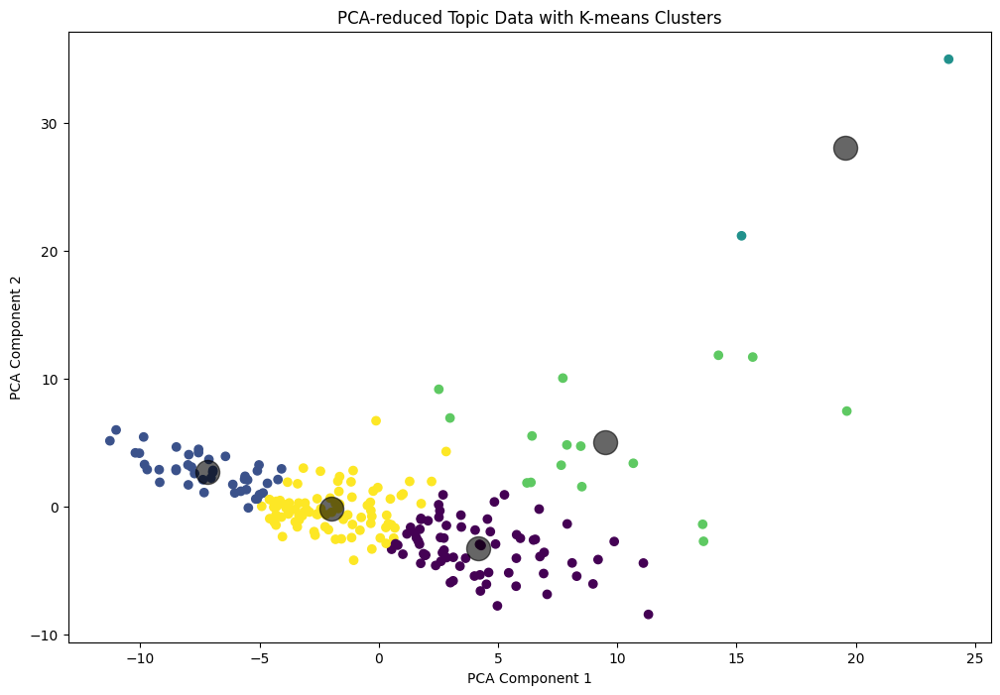

In [ ]:
df_CTM_clu = df_txt_features_CTM.copy()

# Selecting only the topic distribution columns for clustering
topic_columns_CTM= [col for col in df_CTM_clu.columns if col.startswith('Topic')]
topic_data = df_CTM_clu[topic_columns_CTM]

# Using PCA for dimensionality reduction
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(topic_data)

# Applying K-means clustering
kmeans = KMeans(n_clusters=5)  # Choosing 5 clusters arbitrarily, can be tuned
kmeans.fit(reduced_data)
labels = kmeans.predict(reduced_data)

df_CTM_clu['cluster'] = labels

# Plotting the results
plt.figure(figsize=(12, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', marker='o')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=300, alpha=0.6)
plt.title('PCA-reduced Topic Data with K-means Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

#### ETM

The following interactive visualization is only properly displayed in the html version or when run locally.

In [ ]:
prepared_data = pyLDAvis.prepare(topic_term_dists_ETM, doc_topic_dists_ETM, doc_lengths, vocab, term_frequency)

pyLDAvis.display(prepared_data)

The following interactive visualization is only properly displayed in the html version or when run locally.

In [ ]:
# Function to convert year to decade
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_time['decade'] = df_time['date'].apply(year_to_decade)

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped = df_time.groupby('decade')[topic_columns].mean()

plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in topic_columns:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [ ]:
plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in fluctuating_topics:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [ ]:
df_ETM = df_txt_features_ETM.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_ETM['decade'] = df_ETM['date'].apply(year_to_decade)

# Extracting topic columns
topic_columns_ETM= [col for col in df_ETM.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_ETM= df_ETM.groupby('decade')[topic_columns_ETM].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_ETM.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_ETM.index, y=decade_grouped_ETM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig


# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_ETM.index, y=decade_grouped_ETM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])


# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:753: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:591: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:600: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



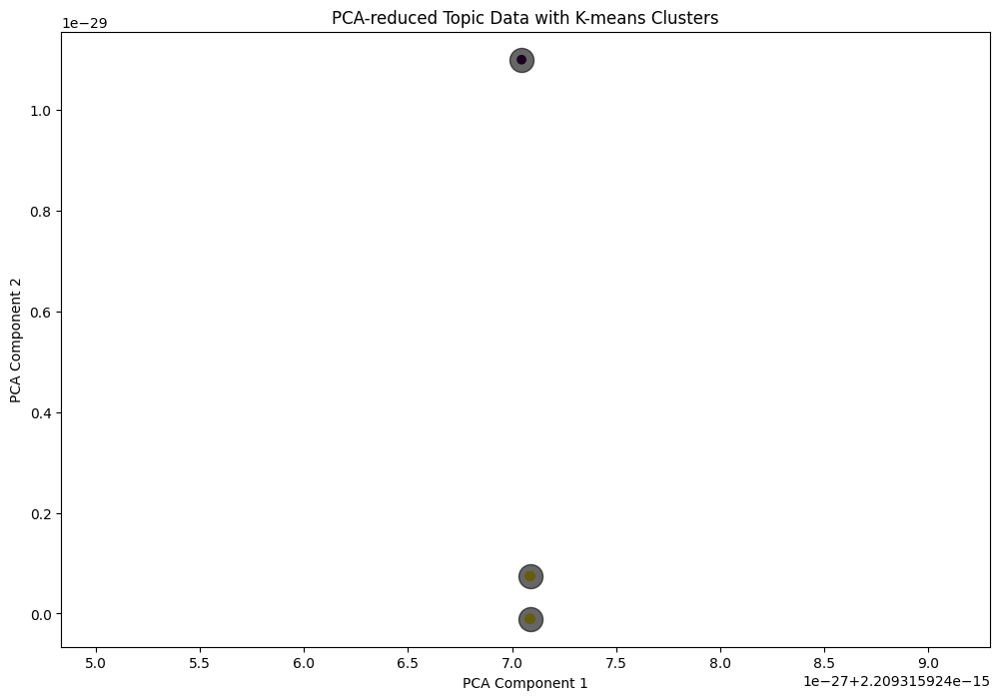

In [ ]:
df_ETM_clu = df_txt_features_ETM.copy()

# Selecting only the topic distribution columns for clustering
topic_columns_ETM= [col for col in df_ETM_clu.columns if col.startswith('Topic')]
topic_data = df_ETM_clu[topic_columns_ETM]

# Using PCA for dimensionality reduction
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(topic_data)

# Applying K-means clustering
kmeans = KMeans(n_clusters=3)
kmeans.fit(reduced_data)
labels = kmeans.predict(reduced_data)

df_ETM_clu['cluster'] = labels

# Plotting the results
plt.figure(figsize=(12, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', marker='o')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=300, alpha=0.6)
plt.title('PCA-reduced Topic Data with K-means Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()